In [2]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import *

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
%matplotlib inline

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller

from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

# Step 1: Read the input


In [3]:
df = pd.read_csv('Walmart DataSet.csv',index_col= 'Date', parse_dates= True)
df_saved = df.copy()
df2 = df.copy()

In [4]:
df.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-05-02,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-12-02,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-05-03,1,1554806.68,0,46.50,2.625,211.350143,8.106


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-05-02 to 2012-10-26
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Weekly_Sales  6435 non-null   float64
 2   Holiday_Flag  6435 non-null   int64  
 3   Temperature   6435 non-null   float64
 4   Fuel_Price    6435 non-null   float64
 5   CPI           6435 non-null   float64
 6   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 402.2 KB


In [6]:
#change month column datainto datetime format
#df['Date'] = pd.to_datetime(df['Date'])

In [7]:
df.isnull().sum()

Store           0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [8]:
df['Weekly_Sales'].min()

209986.25

In [9]:
xdf = df.groupby('Store')['Temperature','Weekly_Sales'].value_counts()
x_Index = xdf.index
x_Index[0]
x_store,x_temp,x_amt=[],[],[]
for i in x_Index:
  x_set = list(i)

  x_store.append(x_set[0])
  x_temp.append(x_set[1])
  x_amt.append(x_set[2])

Xdf = pd.DataFrame(zip(x_store,x_temp,x_amt),columns=['Store', 'Temperature', 'Amt'])
Xdf.head()

,Store,Temperature,Amt
0,1,35.40,1391013.96
1,1,36.39,1649614.93
2,1,67.61,1649604.63
3,1,69.87,1506126.06
4,1,69.86,1345454.00


In [10]:
store_list = df['Store'].unique()
store_list

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

# Step 2: Exploratory Data Analysis

In [11]:
df.shape

(6435, 7)

In [12]:
# no of stores
df.groupby(['Store'])['Store'].unique().shape[0]

45

In [13]:
df.dtypes

Store             int64
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

In [14]:
df.isnull().sum()

Store           0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [15]:
df.duplicated().sum()

0

In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


In [17]:
df.corr()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


# Correlation of Target feature (Weekly_Sales) with thr Independent Features:

In [18]:
store_corr = pd.DataFrame(index=['Store','Weekly_Sales','Holiday_Flag','Temperature','Fuel_Price','CPI','Unemployment'])

#function to extract data from a dataframe, given the name of the data_field name and the corresponding value

def get_store_df(data,data_field,field_value):
    return(data[data[data_field]==field_value])

for i in range(1,46):
    store_df = get_store_df(df,'Store',i)
    store_corr['Store_'+str(i)]=store_df.corr()['Weekly_Sales'].tolist()

In [19]:
store_corr=store_corr.dropna()
store_corrT = store_corr.T
del store_corrT['Weekly_Sales']
store_corrT

,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store_1,0.194905,-0.222701,0.124592,0.225408,-0.097955
Store_2,0.177726,-0.297673,-0.196375,-0.062431,0.066325
Store_3,0.208556,-0.377524,0.140886,0.317250,-0.230413
Store_4,0.153388,-0.225583,0.211549,0.351157,-0.337015
Store_5,0.302525,-0.175517,0.167352,0.308261,-0.207043
Store_6,0.150424,-0.084863,-0.103356,-0.011357,0.044251
Store_7,0.248766,0.015077,0.110356,0.289044,-0.165382
Store_8,0.172383,-0.312324,0.029752,0.120255,-0.052580
Store_9,0.179264,-0.208343,0.205404,0.294805,-0.191534
Store_10,0.195119,-0.432569,-0.185058,-0.115374,0.131908


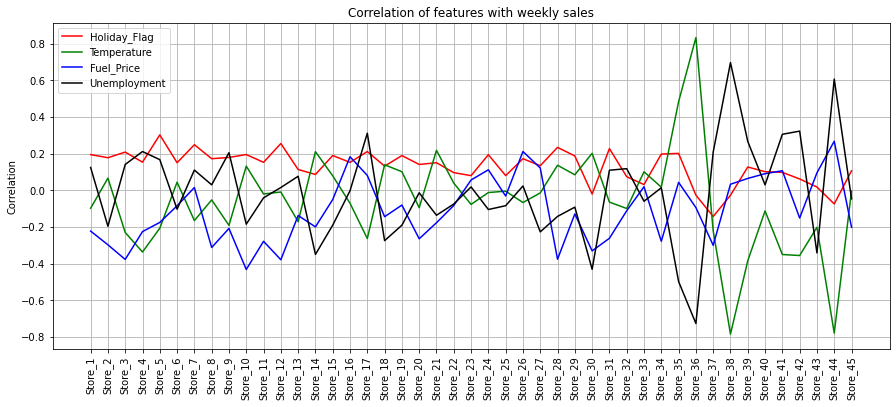

In [20]:
# Examine The Correlationship of independent features with Weekly_Sales

fig,axes =plt.subplots(figsize = (15,6))
plt.xticks(rotation=90)
sns.lineplot(x=store_corrT.index,y=store_corrT.Holiday_Flag,color='red')
sns.lineplot(x=store_corrT.index,y=store_corrT.Unemployment,color='green')
sns.lineplot(x=store_corrT.index,y=store_corrT.Temperature,color='blue')
sns.lineplot(x=store_corrT.index,y=store_corrT.Fuel_Price,color='black')
plt.legend(['Holiday_Flag','Temperature','Fuel_Price','Unemployment'],loc='best')
plt.grid(True)
plt.ylabel('Correlation')
plt.title('Correlation of features with weekly sales')
plt.show()

In [21]:
#positive unemploymemt Correlation
pos_U_corr = store_corrT[store_corrT['Unemployment']>0].sort_values(by='Unemployment')
pos_U_corr

,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store_34,0.197760,-0.278523,0.013688,0.115437,0.017010
Store_22,0.096199,-0.082892,-0.074896,-0.038602,0.039043
Store_6,0.150424,-0.084863,-0.103356,-0.011357,0.044251
Store_2,0.177726,-0.297673,-0.196375,-0.062431,0.066325
Store_15,0.189688,-0.050541,-0.190398,-0.174467,0.078905
Store_29,0.187405,-0.129144,-0.092129,-0.072530,0.084682
Store_33,0.031160,0.019244,-0.059887,-0.052271,0.101175
Store_19,0.189520,-0.080805,-0.190684,-0.155341,0.101464
Store_10,0.195119,-0.432569,-0.185058,-0.115374,0.131908
Store_28,0.234237,-0.376506,-0.142722,-0.095908,0.136671


In [22]:
#negative unemploymemt Correlation
neg_U_corr = store_corrT[store_corrT['Unemployment']<0].sort_values(by='Unemployment')
neg_U_corr

,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store_38,-0.027163,0.032993,0.697184,0.812837,-0.785290
Store_44,-0.074599,0.267822,0.607367,0.740150,-0.780076
Store_39,0.127115,0.064738,0.266659,0.428043,-0.384681
Store_42,0.061810,-0.151639,0.323031,0.360859,-0.356355
Store_41,0.097854,0.106761,0.305745,0.392293,-0.350630
Store_4,0.153388,-0.225583,0.211549,0.351157,-0.337015
Store_17,0.211512,0.081012,0.311631,0.348571,-0.263600
Store_3,0.208556,-0.377524,0.140886,0.317250,-0.230413
Store_37,-0.143336,-0.300493,0.208218,0.244507,-0.221287
Store_5,0.302525,-0.175517,0.167352,0.308261,-0.207043


In [23]:
# The Store with Positive correlation of unemployment and weekly Sales
    #that is to say that for these stores there measures of increase with sales with increase in unemployment
print(f"\n There are {pos_U_corr['Unemployment'].shape[0]} stores whose",
     "sales will increase as Unemployment increases")
print(f"\n{pos_U_corr['Unemployment']}")


 There are 16 stores whose sales will increase as Unemployment increases

Store_34    0.017010
Store_22    0.039043
Store_6     0.044251
Store_2     0.066325
Store_15    0.078905
Store_29    0.084682
Store_33    0.101175
Store_19    0.101464
Store_10    0.131908
Store_28    0.136671
Store_18    0.139179
Store_30    0.201862
Store_14    0.210786
Store_21    0.218367
Store_35    0.483865
Store_36    0.833734
Name: Unemployment, dtype: float64


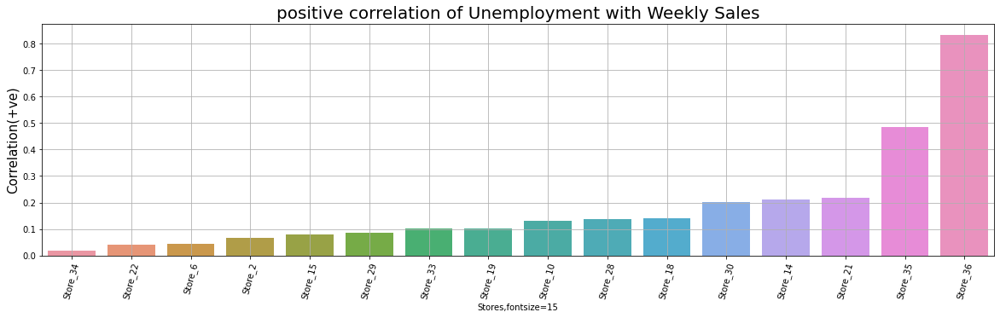

In [24]:
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation=75)
sns.barplot(x=pos_U_corr.index,y=pos_U_corr.Unemployment)
plt.xlabel('Stores,fontsize=15')
plt.ylabel('Correlation(+ve)',fontsize=15)
plt.title('positive correlation of Unemployment with Weekly Sales',fontsize=20)
plt.grid(True)

In [25]:
# The Store with negative correlation of unemployment and weekly Sales
    #that is to say that for these stores there measures of decrease with sales with increase in unemployment
print(f"\n There are {neg_U_corr['Unemployment'].shape[0]} stores whose",
     "sales will decrease as Unemployment increases")
print(f"\n{neg_U_corr['Unemployment']}")


 There are 29 stores whose sales will decrease as Unemployment increases

Store_38   -0.785290
Store_44   -0.780076
Store_39   -0.384681
Store_42   -0.356355
Store_41   -0.350630
Store_4    -0.337015
Store_17   -0.263600
Store_3    -0.230413
Store_37   -0.221287
Store_5    -0.207043
Store_43   -0.201954
Store_9    -0.191534
Store_13   -0.171633
Store_7    -0.165382
Store_40   -0.112528
Store_32   -0.099455
Store_1    -0.097955
Store_20   -0.095341
Store_23   -0.077169
Store_16   -0.070864
Store_26   -0.066899
Store_31   -0.064738
Store_8    -0.052580
Store_11   -0.020339
Store_27   -0.014275
Store_24   -0.012261
Store_12   -0.009286
Store_25   -0.004958
Store_45   -0.004041
Name: Unemployment, dtype: float64


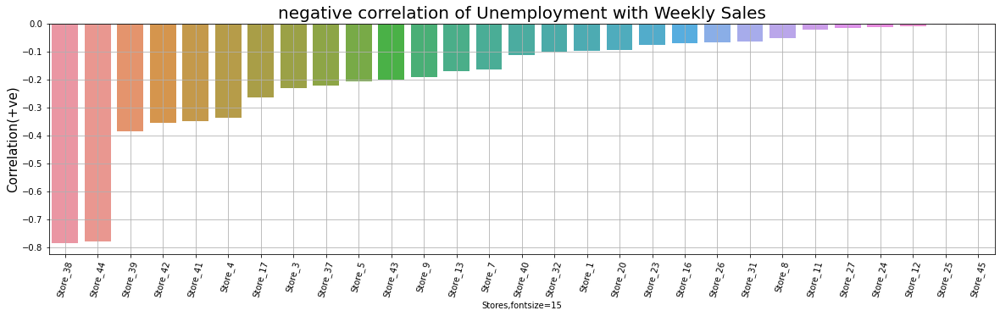

In [26]:
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation=75)
sns.barplot(x=neg_U_corr.index,y=neg_U_corr.Unemployment)
plt.xlabel('Stores,fontsize=15')
plt.ylabel('Correlation(+ve)',fontsize=15)
plt.title('negative correlation of Unemployment with Weekly Sales',fontsize=20)
plt.grid(True)

In [27]:
Unemployment_1 =pd.DataFrame(zip(pos_U_corr.index,pos_U_corr.Unemployment),columns=['Stores(pos)','corr(pos)'])
Unemployment_2 =pd.DataFrame(zip(neg_U_corr.index,neg_U_corr.Unemployment),columns=['Stores(neg)','corr(neg)'])

Unemployment =pd.concat([Unemployment_2,Unemployment_1],axis=1,join='outer',ignore_index=True)

Unemployment.columns=['Stores(neg)','Corr(neg)','Stores(pos)','Corr(pos)']
Unemployment

,Stores(neg),Corr(neg),Stores(pos),Corr(pos)
0,Store_38,-0.785290,Store_34,0.017010
1,Store_44,-0.780076,Store_22,0.039043
2,Store_39,-0.384681,Store_6,0.044251
3,Store_42,-0.356355,Store_2,0.066325
4,Store_41,-0.350630,Store_15,0.078905
5,Store_4,-0.337015,Store_29,0.084682
6,Store_17,-0.263600,Store_33,0.101175
7,Store_3,-0.230413,Store_19,0.101464
8,Store_37,-0.221287,Store_10,0.131908
9,Store_5,-0.207043,Store_28,0.136671


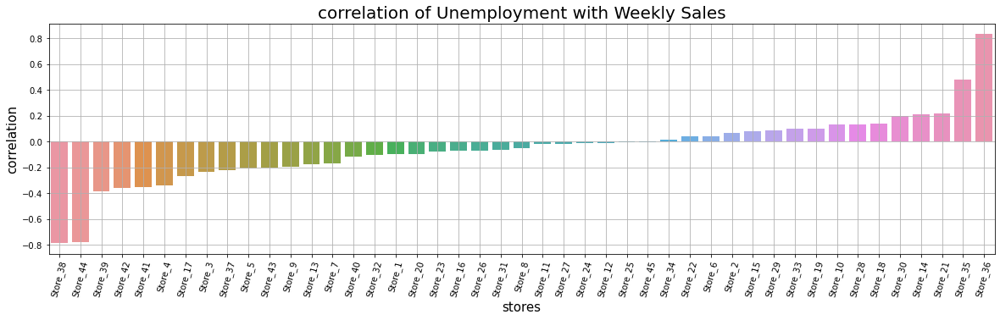

In [28]:
store_corrTT = store_corrT.sort_values(by='Unemployment')
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation = 75)
sns.barplot(x=store_corrTT.index,y=store_corrTT.Unemployment)
plt.xlabel('stores',fontsize=15)
plt.ylabel('correlation',fontsize=15)
plt.title("correlation of Unemployment with Weekly Sales",fontsize = 20)
plt.grid(True)

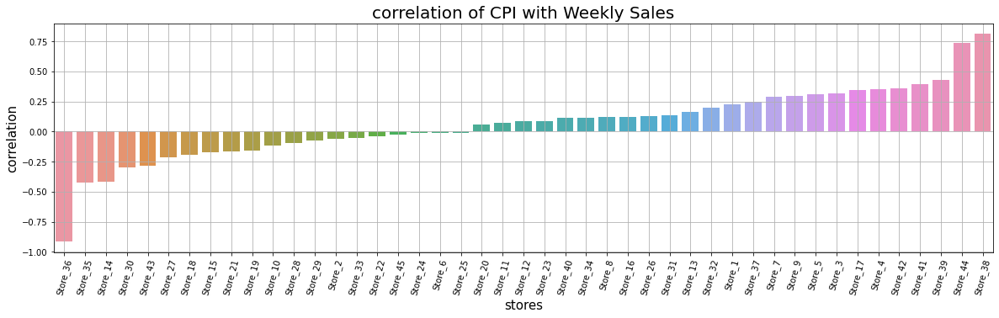

In [29]:
store_corrTT = store_corrT.sort_values(by='CPI')
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation = 75)
sns.barplot(x=store_corrTT.index,y=store_corrTT.CPI)
plt.xlabel('stores',fontsize=15)
plt.ylabel('correlation',fontsize=15)
plt.title("correlation of CPI with Weekly Sales",fontsize = 20)
plt.grid(True)

In [30]:
store_corrTT.columns

Index(['Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment'], dtype='object')

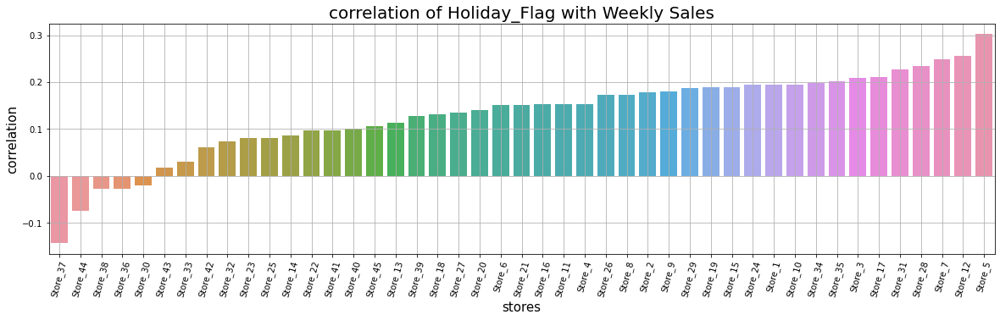

In [31]:
store_corrTT = store_corrT.sort_values(by='Holiday_Flag')
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation = 75)
sns.barplot(x=store_corrTT.index,y=store_corrTT.Holiday_Flag)
plt.xlabel('stores',fontsize=15)
plt.ylabel('correlation',fontsize=15)
plt.title("correlation of Holiday_Flag with Weekly Sales",fontsize = 20)
plt.grid(True)

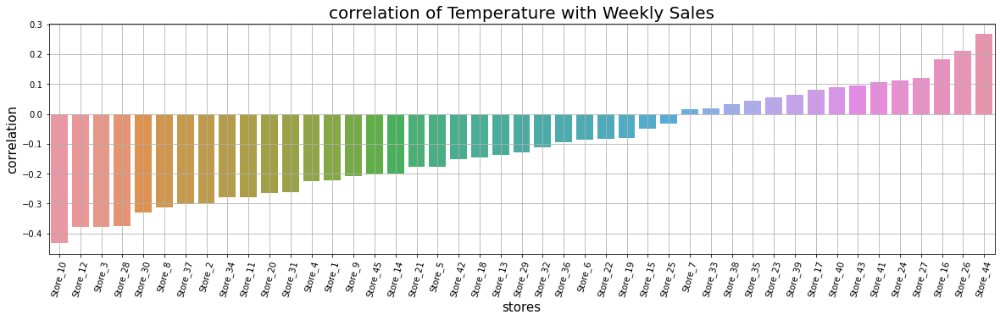

In [32]:
store_corrTT = store_corrT.sort_values(by='Temperature')
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation = 75)
sns.barplot(x=store_corrTT.index,y=store_corrTT.Temperature)
plt.xlabel('stores',fontsize=15)
plt.ylabel('correlation',fontsize=15)
plt.title("correlation of Temperature with Weekly Sales",fontsize = 20)
plt.grid(True)

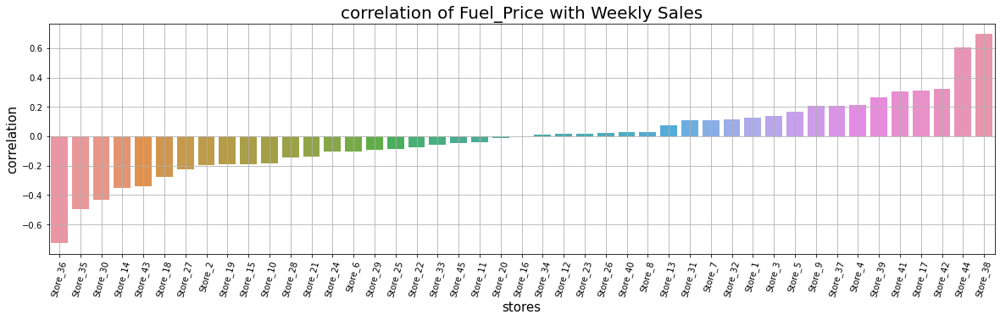

In [33]:
store_corrTT = store_corrT.sort_values(by='Fuel_Price')
fig,axes=plt.subplots(figsize=(20,5))
plt.xticks(rotation = 75)
sns.barplot(x=store_corrTT.index,y=store_corrTT.Fuel_Price)
plt.xlabel('stores',fontsize=15)
plt.ylabel('correlation',fontsize=15)
plt.title("correlation of Fuel_Price with Weekly Sales",fontsize = 20)
plt.grid(True)

In [34]:
#Explore correlation of other features with Weekly_Sales
df.corr()['Weekly_Sales']

#Correlation shows that Fuel_Price has the least effect on the Weekly_Sales
#Unemployment has the strongest Correlation with negative correlation which says that
# as unemployment goes up, the Weekly_Sales decreases.

Store          -0.335332
Weekly_Sales    1.000000
Holiday_Flag    0.036891
Temperature    -0.063810
Fuel_Price      0.009464
CPI            -0.072634
Unemployment   -0.106176
Name: Weekly_Sales, dtype: float64

In [35]:
Highest_Weekly_Sales= df.groupby(['Store'])['Weekly_Sales'].sum().reset_index().sort_values('Weekly_Sales',ascending = False)
store_list = Highest_Weekly_Sales['Store'].tolist()
highest_10 = Highest_Weekly_Sales['Store'].head(10).tolist()

print(Highest_Weekly_Sales.head(10),
     f"\n\nThe Ten Stores with The Highest Weekly Sales {highest_10}")


    Store  Weekly_Sales
19     20  3.013978e+08
3       4  2.995440e+08
13     14  2.889999e+08
12     13  2.865177e+08
1       2  2.753824e+08
9      10  2.716177e+08
26     27  2.538559e+08
5       6  2.237561e+08
0       1  2.224028e+08
38     39  2.074455e+08 

The Ten Stores with The Highest Weekly Sales [20, 4, 14, 13, 2, 10, 27, 6, 1, 39]


AttributeError: 'str' object has no attribute 'get'

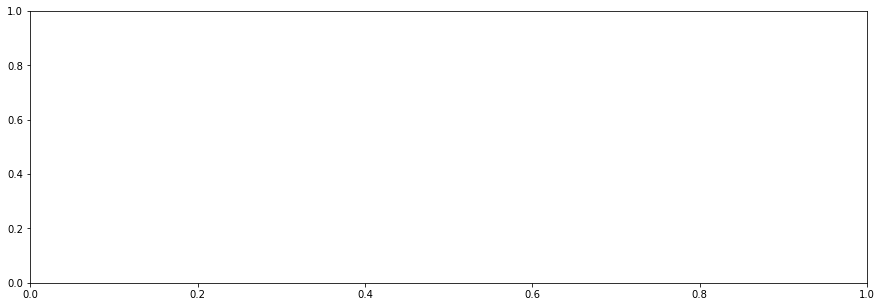

In [38]:
fig,axes=plt.subplots(figsize=(15,5))
sns.barplot(x='Store',y='Weekly_Sales', data='Highest_Weekly_Sales', color='red')
plt.xticks(rotation=90)
plt.title('Weekly Sales', fontsize=25)
plt.xlabel('Store',fontsize =25)
plt.ylabel('Weekly_Sales',fontsize=15)

In [39]:
# Average Weekly_Sales of all the stores
Avg_Weekly_Sales= df.groupby(['Store'])['Weekly_Sales'].mean().reset_index().sort_values('Weekly_Sales',ascending = False)
Avg_Weekly_Sales.head(10)

,Store,Weekly_Sales
19,20,2.107677e+06
3,4,2.094713e+06
13,14,2.020978e+06
12,13,2.003620e+06
1,2,1.925751e+06
9,10,1.899425e+06
26,27,1.775216e+06
5,6,1.564728e+06
0,1,1.555264e+06
38,39,1.450668e+06


AttributeError: 'str' object has no attribute 'get'

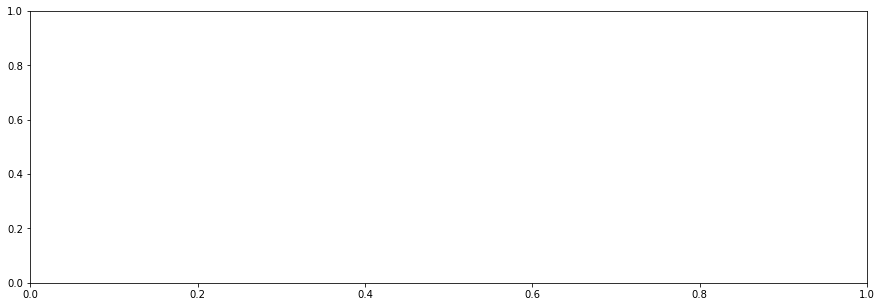

In [40]:
fig,axes=plt.subplots(figsize=(15,5))
sns.barplot(x='Store',y='Weekly_Sales', data='Avg_Weekly_Sales', color='green')
plt.xticks(rotation=90)
plt.title('Average Weekly Sales', fontsize=25)
plt.xlabel('Store',fontsize =25)
plt.ylabel('Weekly_Sales',fontsize=15)

In [41]:
highest_10

[20, 4, 14, 13, 2, 10, 27, 6, 1, 39]

In [42]:
#Number of sales records reported by each store
store_count=df['Store'].value_counts().unique()
print(f"Each Store reported {store_count[0]} Weekly Sales")

Each Store reported 143 Weekly Sales


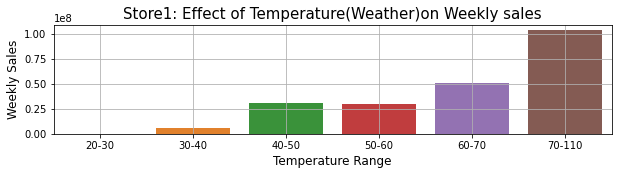

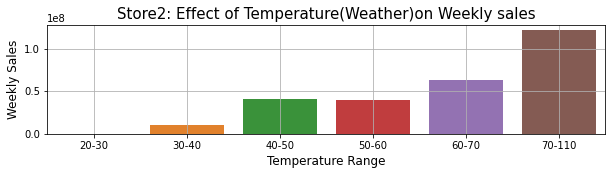

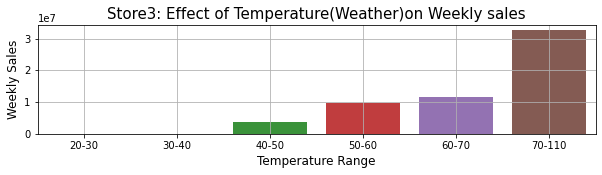

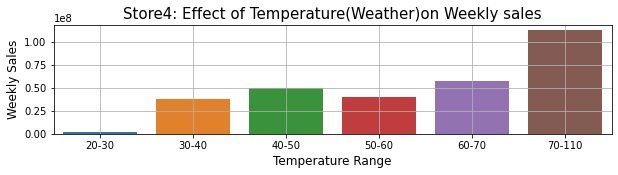

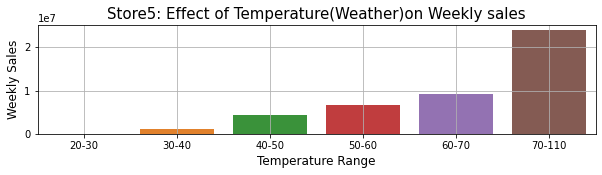

...

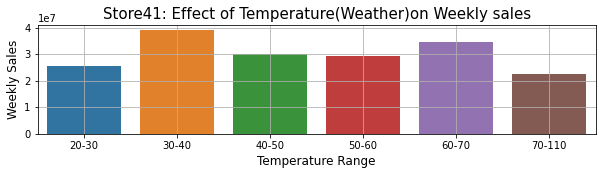

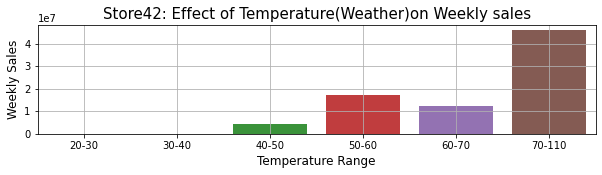

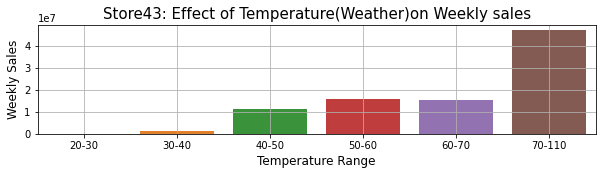

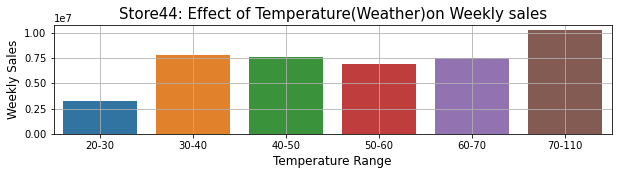

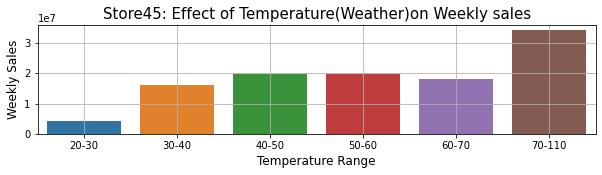

In [43]:
#Investigate the effect of Weather on Weekly Sales of the stores
store_list=df['Store'].unique()

for i in store_list:
    x_store=get_store_df(df,'Store',i)
    x_store= x_store[['Store','Temperature','Weekly_Sales']].sort_values('Temperature')
    x_store['Temperature']=pd.cut(x_store['Temperature'],
            bins =    [0,      30,     40,     50,     60,   70,  110], 
            labels = ['20-30','30-40','40-50','50-60','60-70','70-110'])
    x_store=x_store.groupby('Temperature')['Weekly_Sales'].sum().reset_index()
    
    fig,axes =plt.subplots(figsize=(10,2))
    sns.barplot(x=x_store.Temperature,y=x_store.Weekly_Sales)
    plt.xlabel("Temperature Range",fontsize =12)
    plt.ylabel("Weekly Sales",fontsize =12)
    plt.title(f"Store{i}: Effect of Temperature(Weather)on Weekly sales", fontsize=15)
    plt.grid(True)
    

In [44]:
#extract Data for each store and store in a file
Store_1=df[df['Store']==1]
Store_2=df[df['Store']==2]
Store_3=df[df['Store']==3]
Store_4=df[df['Store']==4]
Store_5=df[df['Store']==5]
Store_6=df[df['Store']==6]
Store_7=df[df['Store']==7]
Store_8=df[df['Store']==8]
Store_9=df[df['Store']==9]
Store_10=df[df['Store']==10]

Store_11=df[df['Store']==11]
Store_12=df[df['Store']==12]
Store_13=df[df['Store']==13]
Store_14=df[df['Store']==14]
Store_15=df[df['Store']==15]
Store_16=df[df['Store']==16]
Store_17=df[df['Store']==17]
Store_18=df[df['Store']==18]
Store_19=df[df['Store']==19]
Store_20=df[df['Store']==20]

Store_21=df[df['Store']==21]
Store_22=df[df['Store']==22]
Store_23=df[df['Store']==23]
Store_24=df[df['Store']==24]
Store_25=df[df['Store']==25]
Store_26=df[df['Store']==26]
Store_27=df[df['Store']==27]
Store_28=df[df['Store']==28]
Store_29=df[df['Store']==29]
Store_30=df[df['Store']==30]

Store_31=df[df['Store']==31]
Store_32=df[df['Store']==32]
Store_33=df[df['Store']==33]
Store_34=df[df['Store']==34]
Store_35=df[df['Store']==35]
Store_36=df[df['Store']==36]
Store_37=df[df['Store']==37]
Store_38=df[df['Store']==38]
Store_39=df[df['Store']==39]
Store_40=df[df['Store']==40]

Store_41=df[df['Store']==41]
Store_42=df[df['Store']==42]
Store_43=df[df['Store']==43]
Store_44=df[df['Store']==44]
Store_45=df[df['Store']==45]


# Outliers Investigation - Examine the Outliers for Weekly_Sales on all stores
It's observed that only stores 36,38,42,43 and 44 have minimal or no Outliers


In [45]:
def outlier_plot(xrange, l=5, w=2, wl=20, ww=10, hs=1.5):
    fig,axes = plt.subplots(l,w, figsize=(wl,ww))
    plt.subplots_adjust(hspace =hs)
    j=1
    
    for i in xrange:
        store_df=get_store_df(df,'Store',i)
        plt.subplot(l,w,j)
        sns.boxplot(x=store_df['Weekly_Sales'])
        plt.title(f"Store:{i}",fontsize =15)
        j=j+1

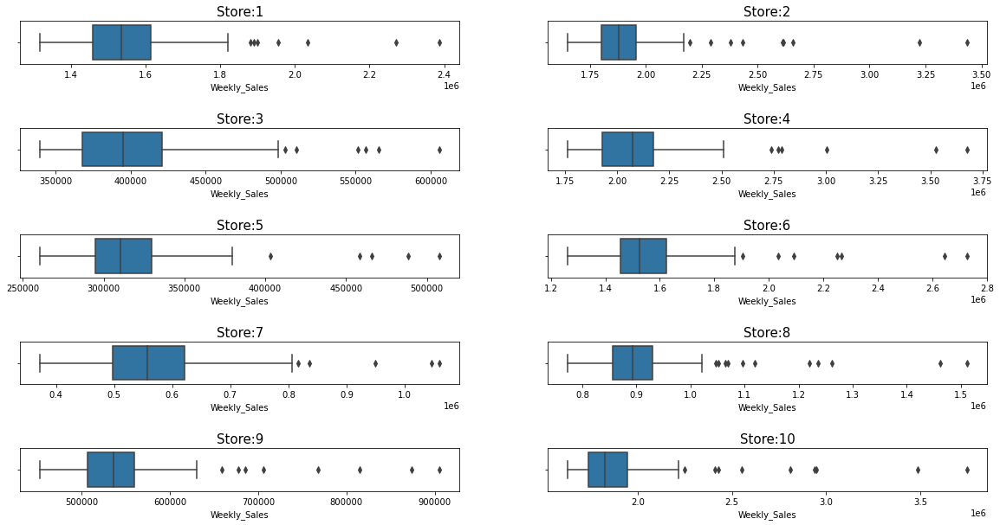

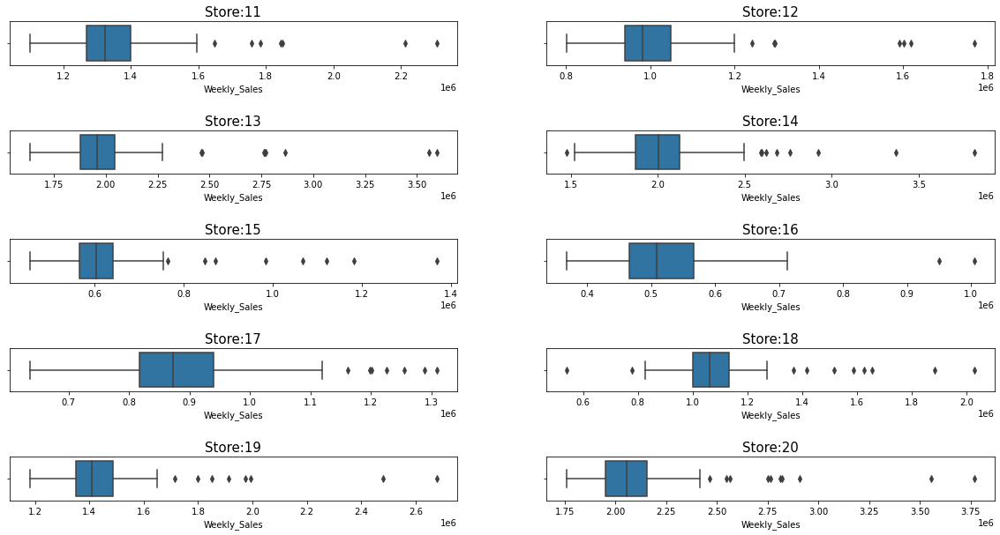

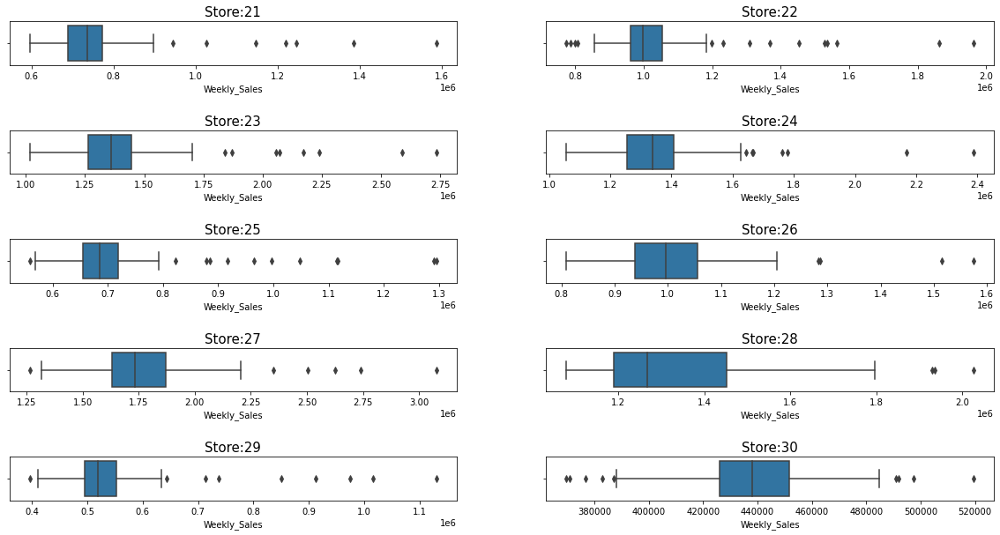

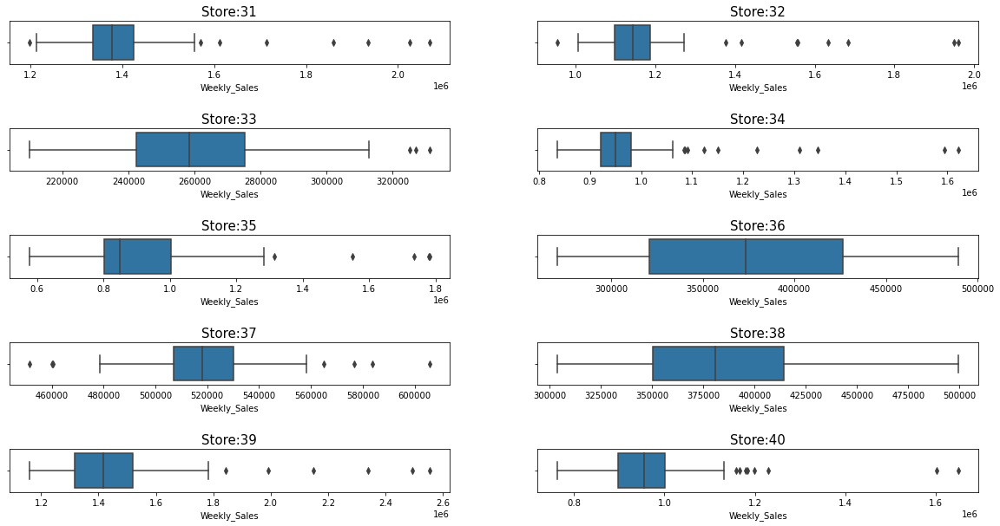

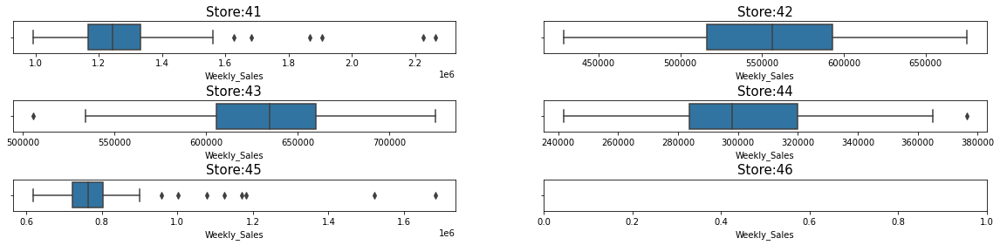

In [46]:
#Box plot of weekly_Sales for Stores 1-45

outlier_plot(range(1,11))
outlier_plot(range(11,21))
outlier_plot(range(21,31))
outlier_plot(range(31,41))
outlier_plot(range(41,47),3,2,20,4)

In [48]:
#note that all the stores have outliers on the weekly_sales except stores: 36,38,42,43 and 44

# Temperature,Unemployment & CPI Effects on Weekly Sales

In [49]:
#Examine graphically the Effects of the independent features on the Weekly Sales

In [50]:
#plot the effects of Temperature,Unemployment,CPI and Fuel_price on Weekly_Sales

def plot_features_effect(store_list):
    plt.subplots_adjust(wspace = 0.2)
    font_axix, font_tick = 25,25
    font_title =35
    
    for i in store_list:
        fig,axes = plt.subplots(2,2, figsize=(45,15))
        plt.subplots_adjust(hspace =0.5)
        
        store_df = get_store_df(df,'Store',i)
        
        plt.subplot(2,2,1)
        sns.lineplot(x = 'Fuel_Price', y='Weekly_Sales', data=store_df,color='blue');
        plt.title(f"store {i}: Effect of Fuel Price on Weekly Sales",fontsize = font_title)
        plt.xlabel('Fuel Price', fontsize=font_axix)
        plt.ylabel('Weekly_Sales', fontsize=font_axix)
        plt.xticks(fontsize=font_tick)
        plt.yticks(fontsize=font_tick)
        
        plt.subplot(2,2,2)
        sns.lineplot(x ='CPI', y='Weekly_Sales', data=store_df,color='red');
        plt.title(f"store {i}: Effect of CPI on Weekly Sales",fontsize = font_title)
        plt.xlabel('CPI', fontsize=font_axix)
        plt.ylabel('Weekly_Sales', fontsize=font_axix)
        plt.xticks(fontsize=font_tick)
        plt.yticks(fontsize=font_tick)
        
        plt.subplot(2,2,3)
        sns.lineplot(x ='Unemployment', y='Weekly_Sales', data=store_df,color='yellow');
        plt.title(f"store {i}: Effect of Unemployment on Weekly Sales",fontsize = font_title)
        plt.xlabel('Unemployment', fontsize=font_axix)
        plt.ylabel('Weekly_Sales', fontsize=font_axix)
        plt.xticks(fontsize=font_tick)
        plt.yticks(fontsize=font_tick)
        
        plt.subplot(2,2,4)
        sns.lineplot(x ='Temperature', y='Weekly_Sales', data=store_df,color='black');
        plt.title(f"store {i}: Effect of Temperature on Weekly Sales",fontsize = font_title)
        plt.xlabel('Temperature', fontsize=font_axix)
        plt.ylabel('Weekly_Sales', fontsize=font_axix)
        plt.xticks(fontsize=font_tick)
        plt.yticks(fontsize=font_tick)
        plt.show()

<Figure size 432x288 with 0 Axes>

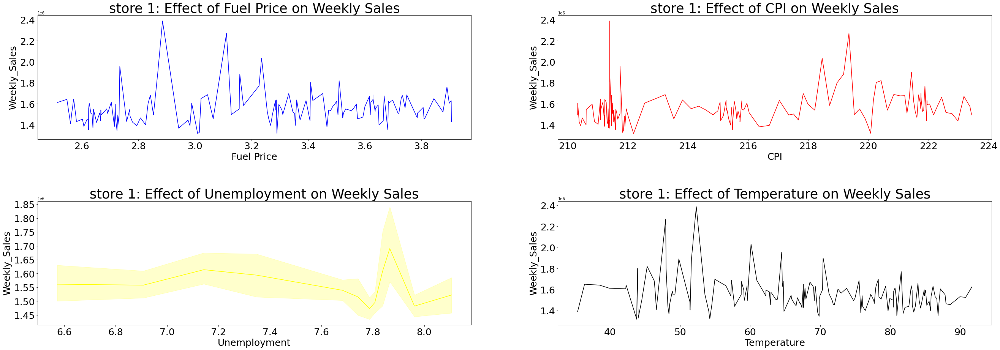

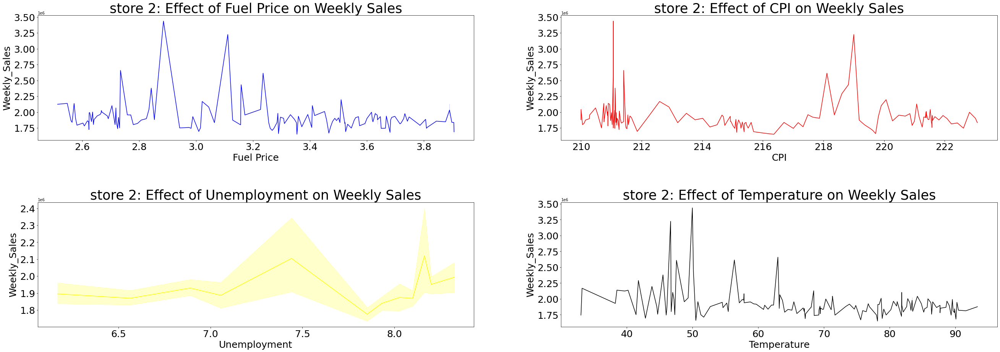

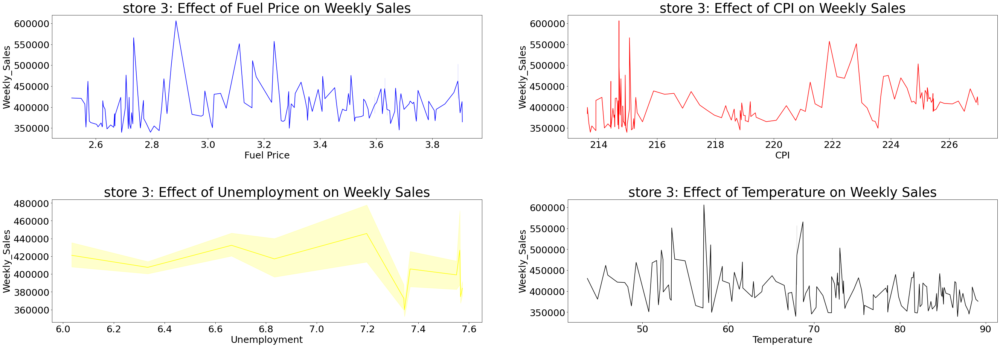

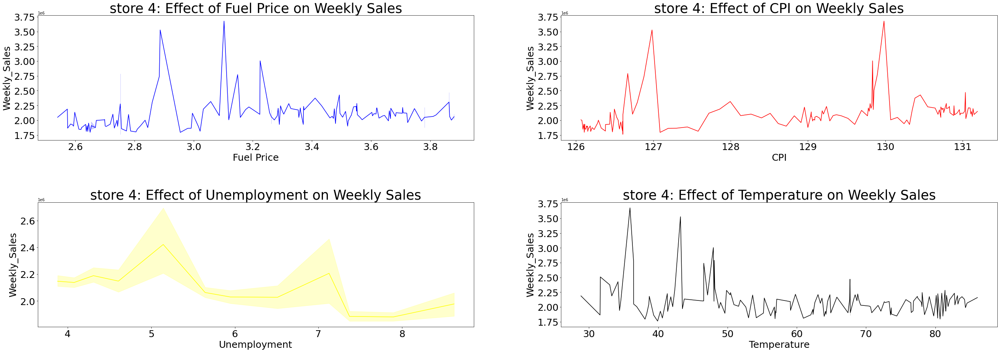

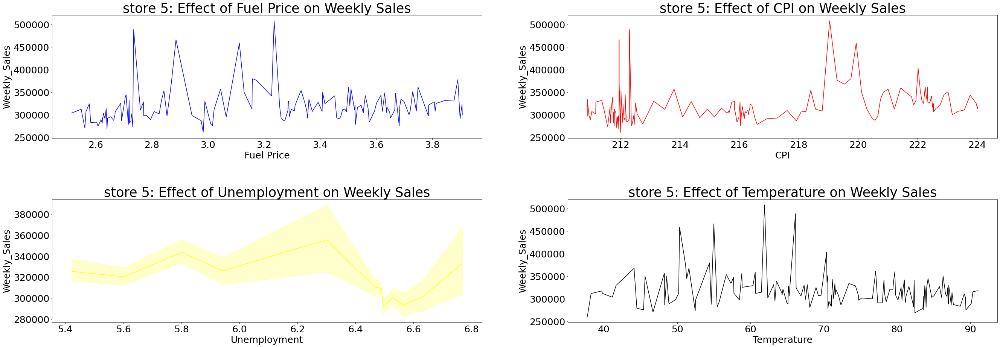

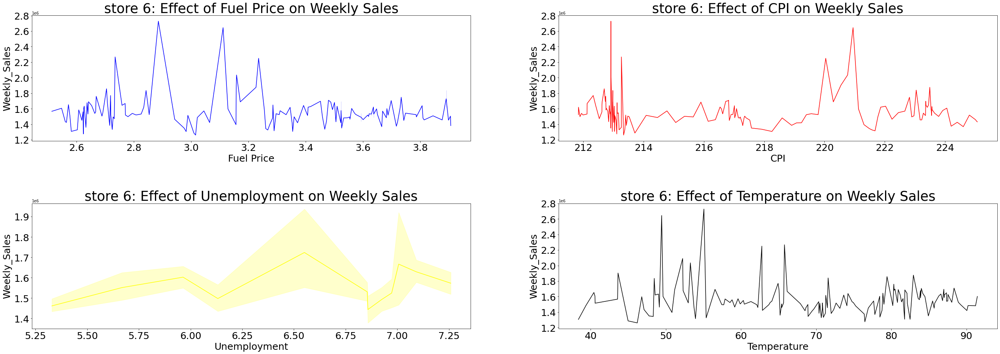

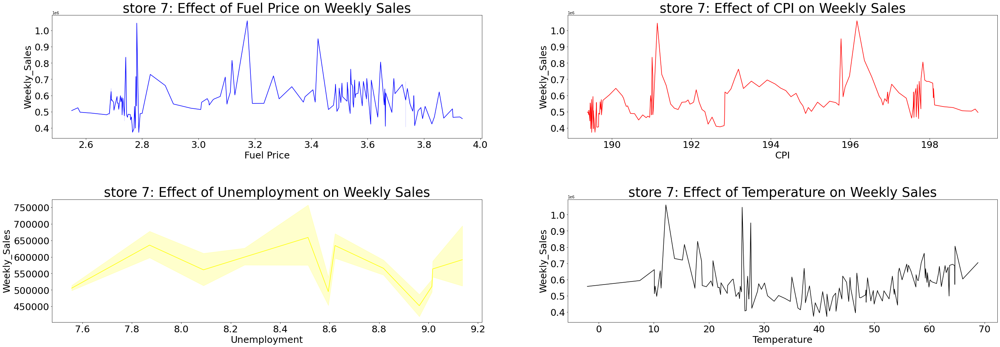

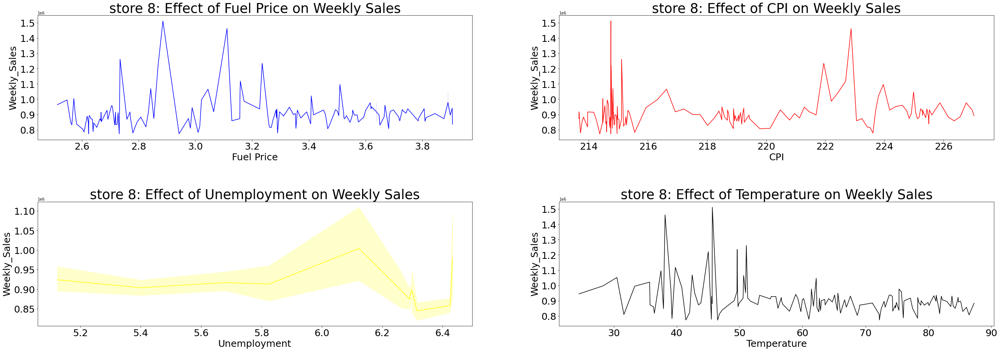

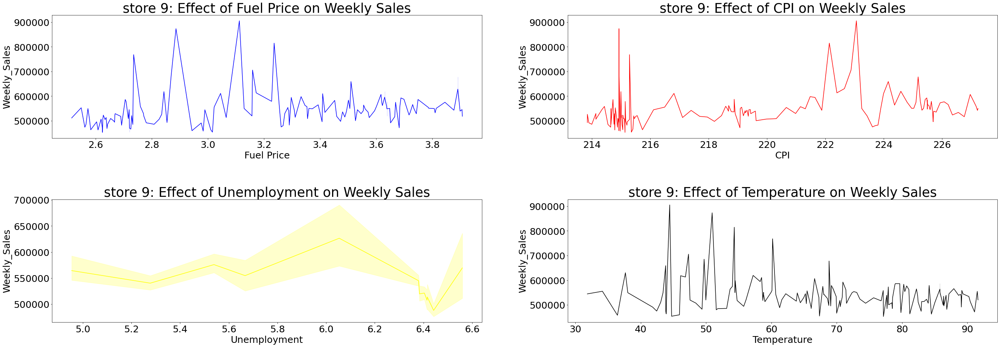

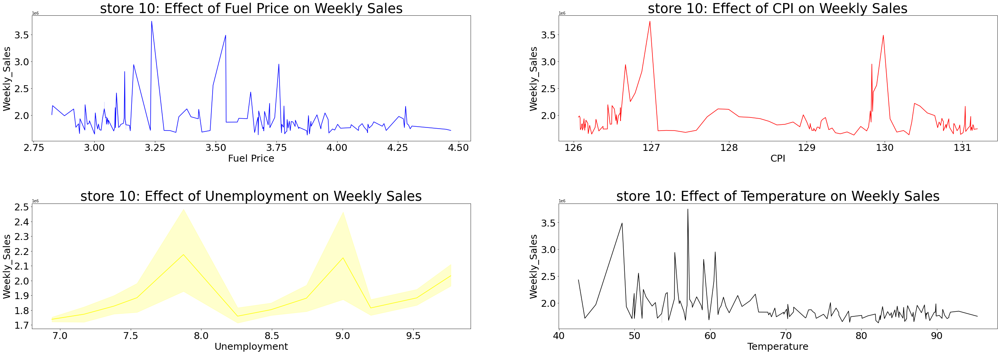

<Figure size 432x288 with 0 Axes>

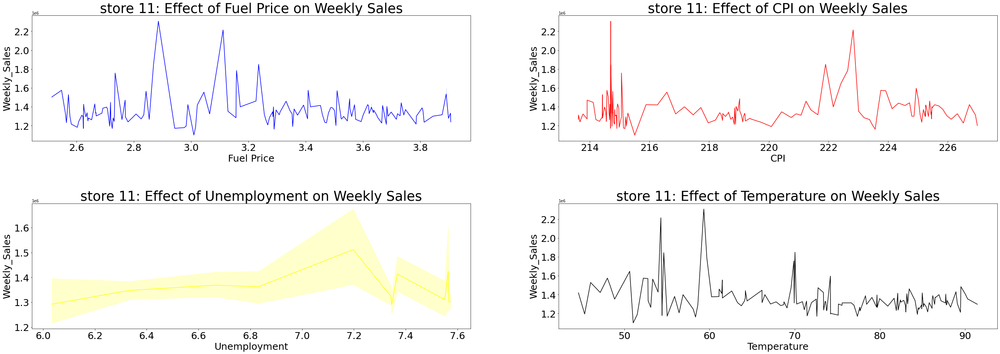

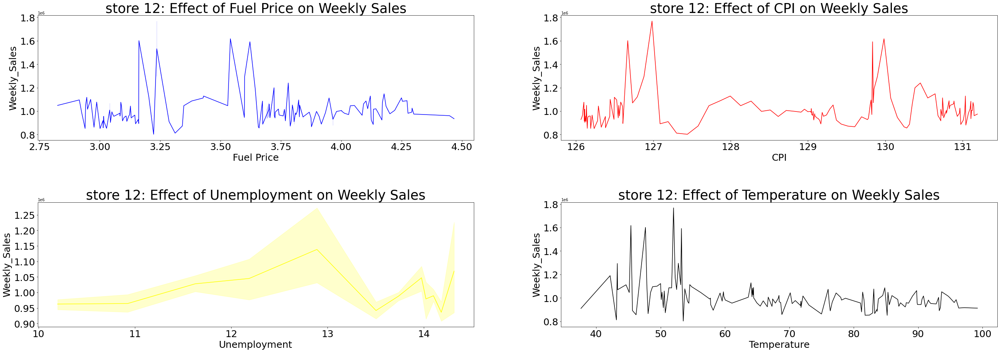

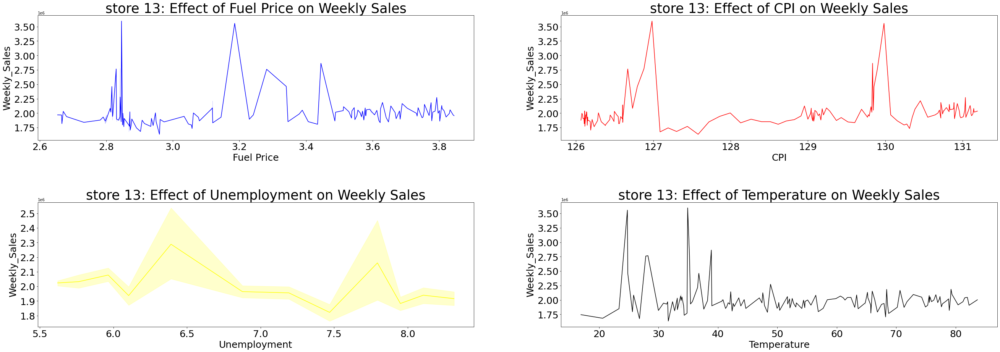

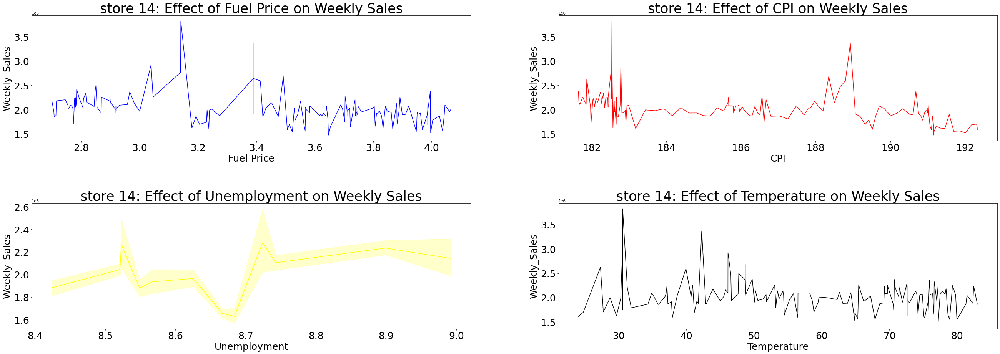

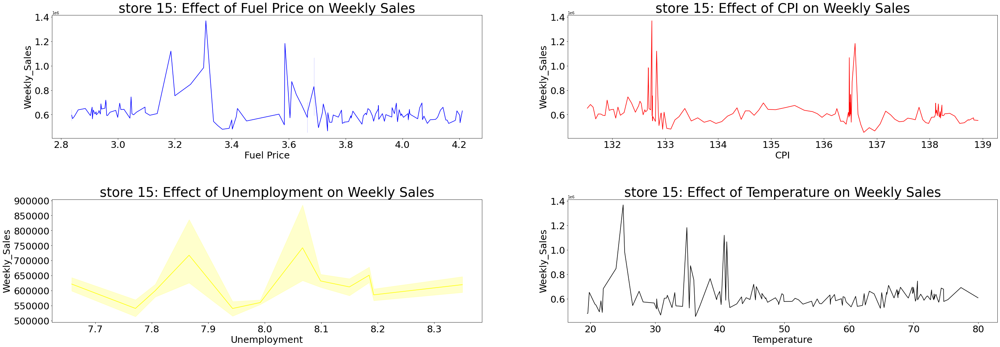

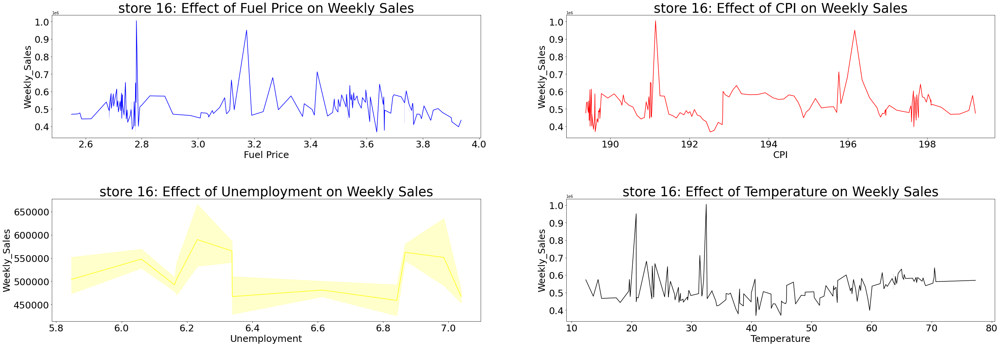

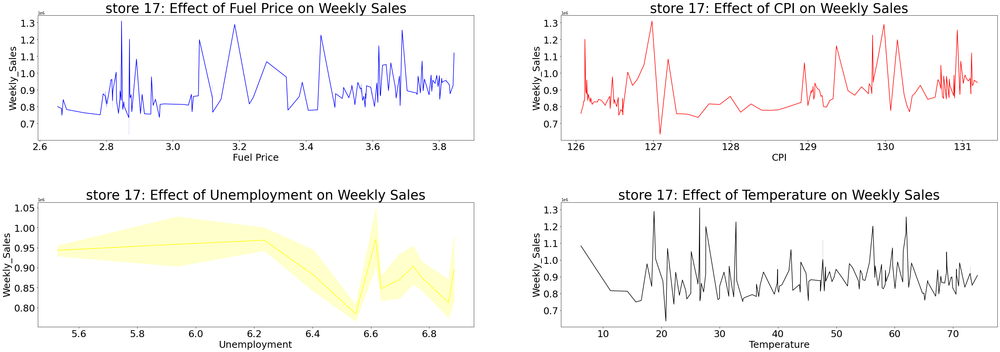

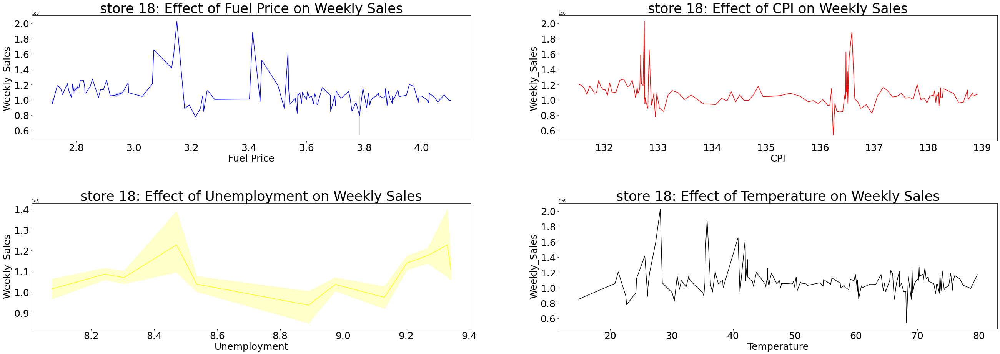

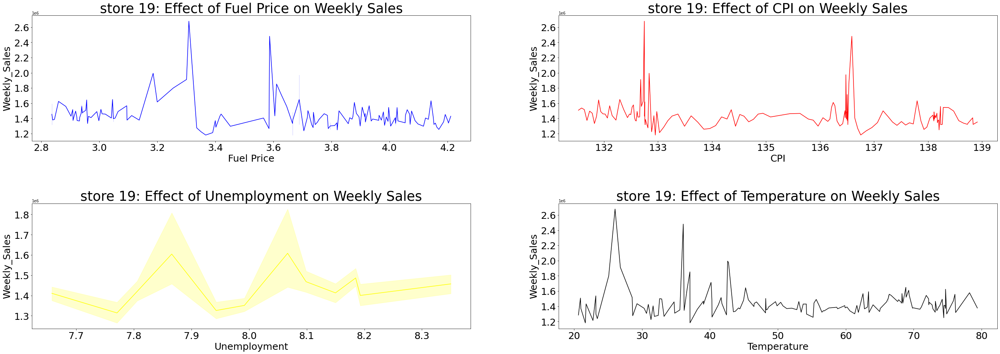

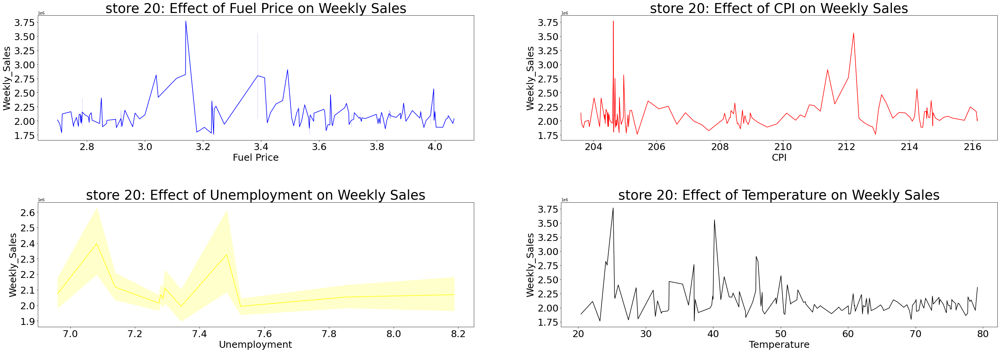

<Figure size 432x288 with 0 Axes>

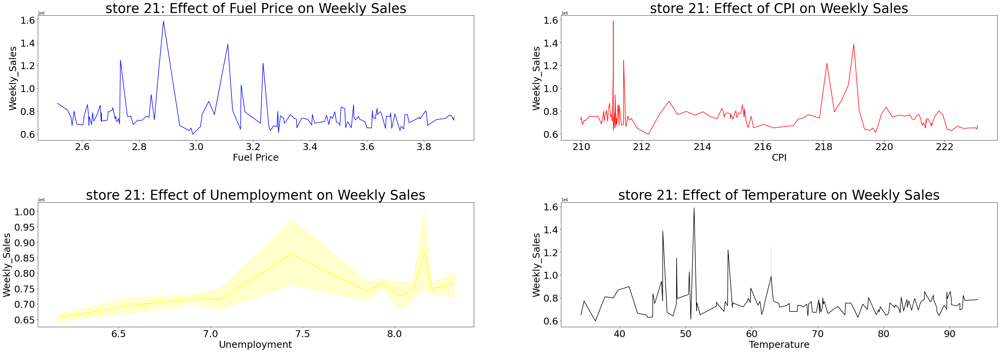

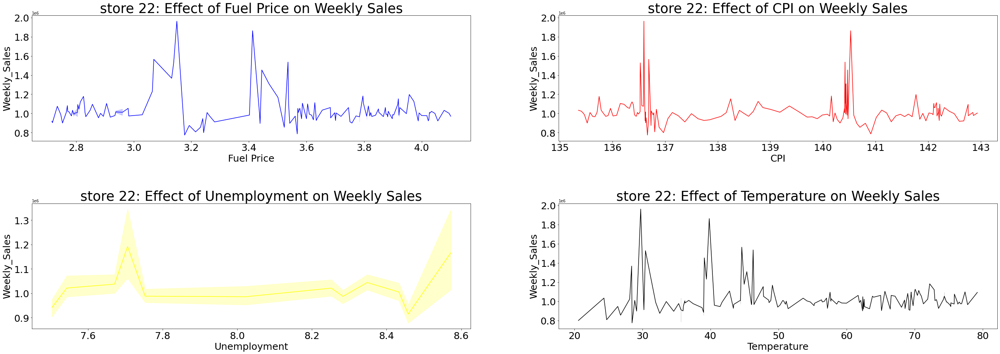

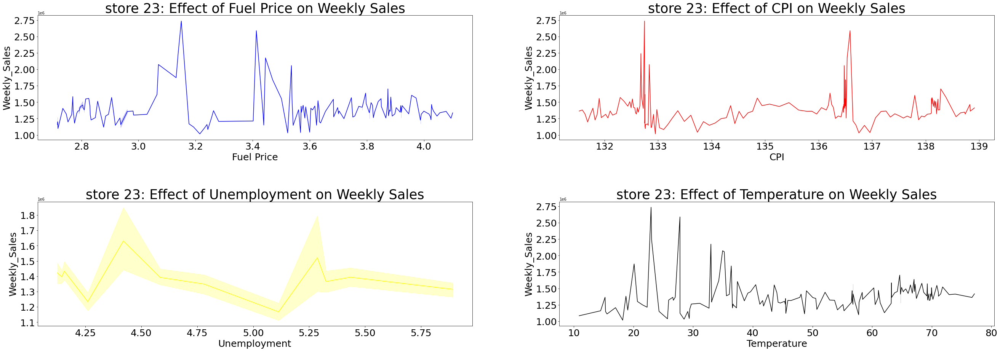

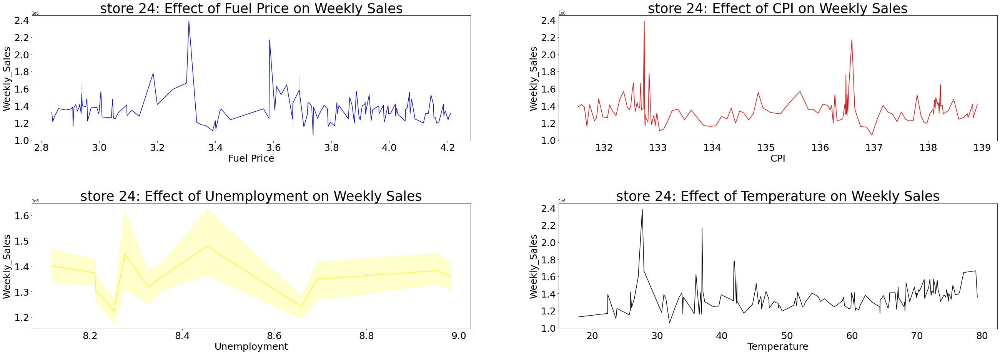

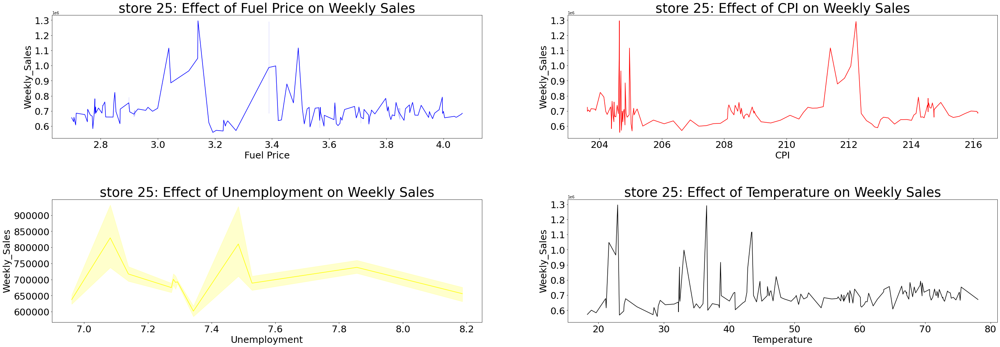

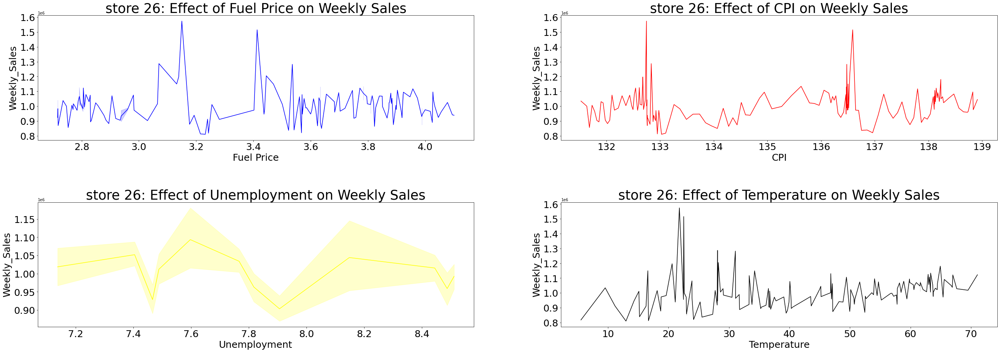

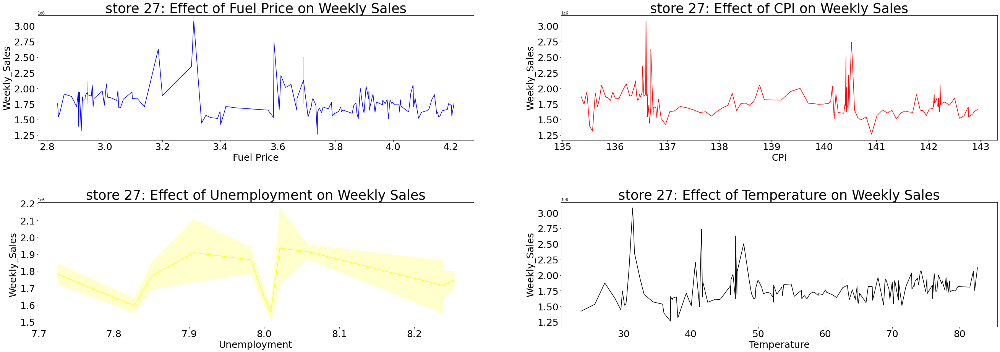

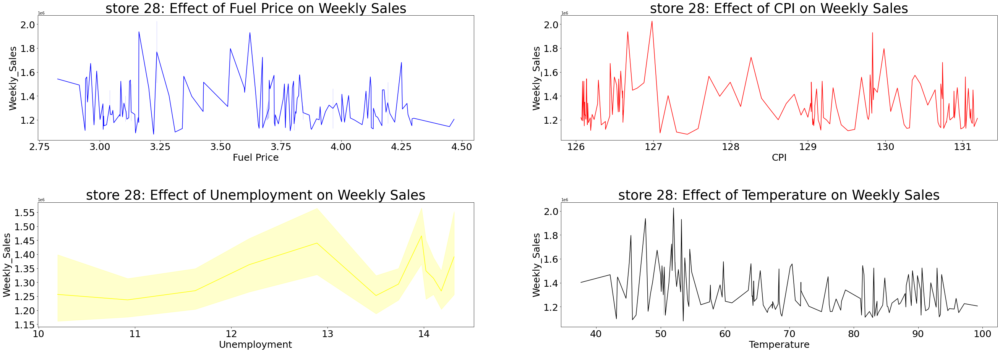

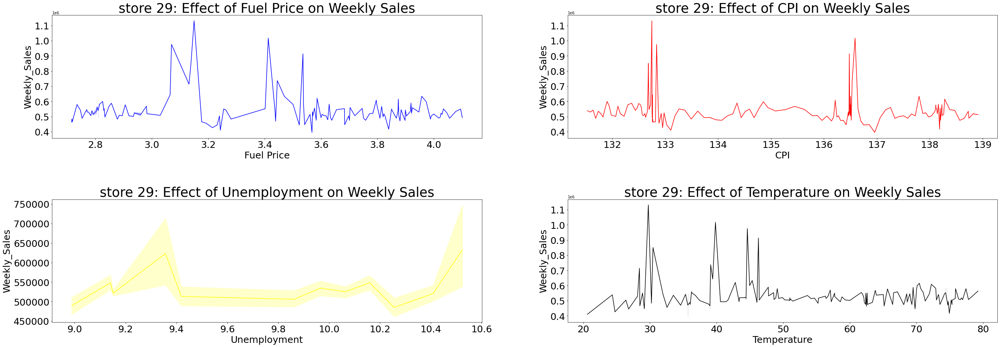

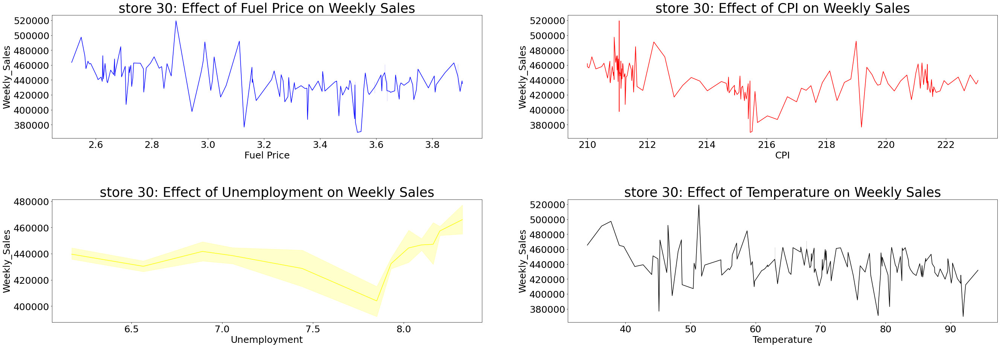

<Figure size 432x288 with 0 Axes>

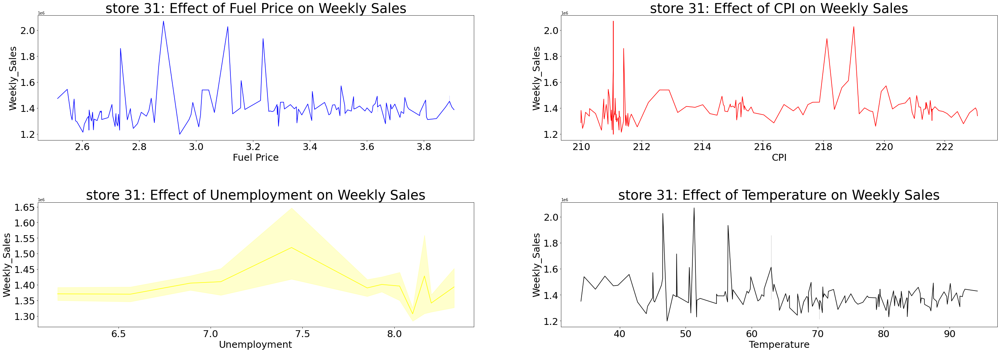

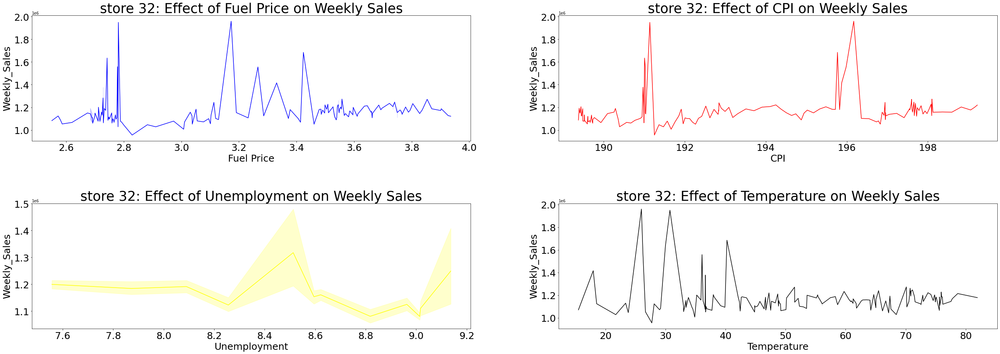

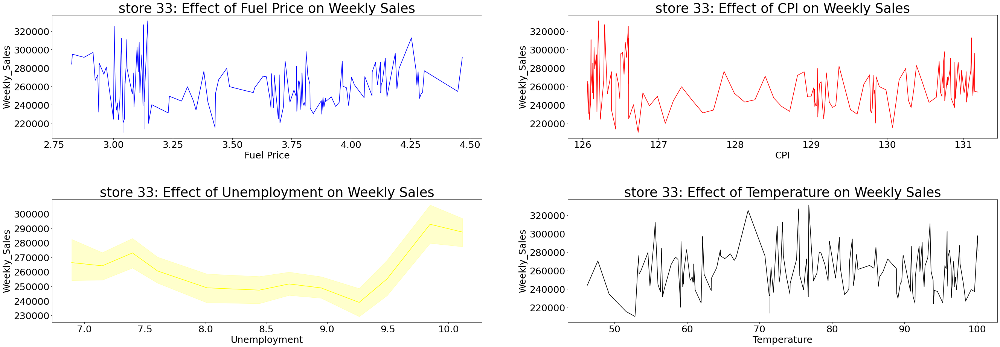

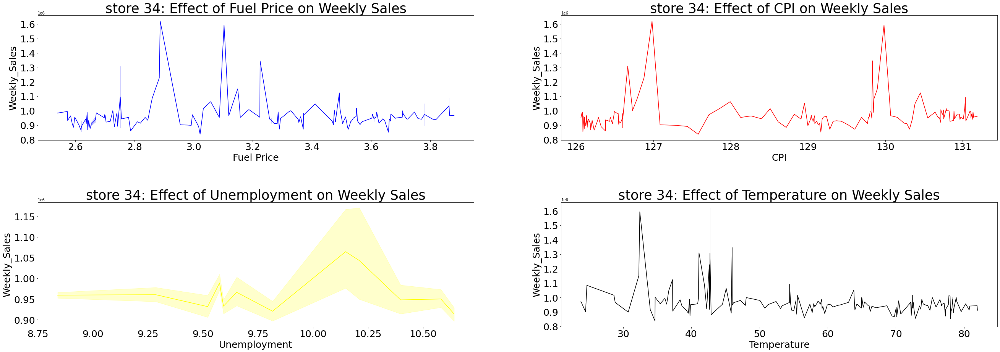

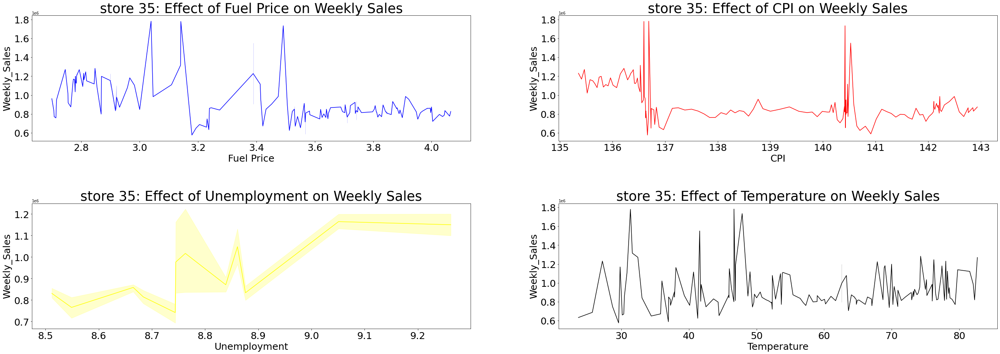

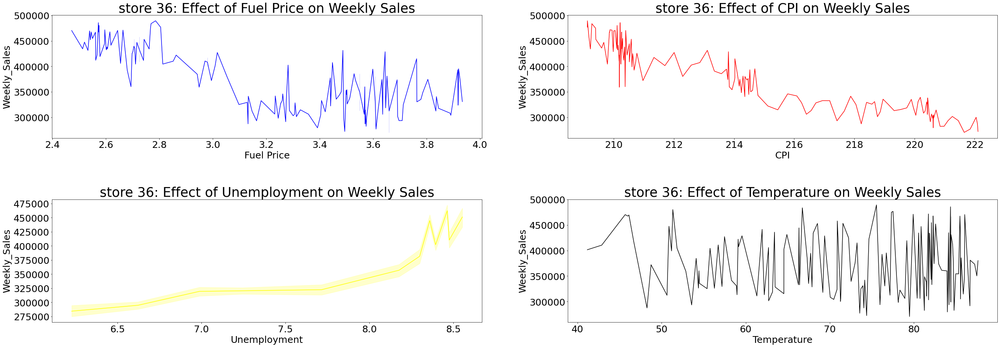

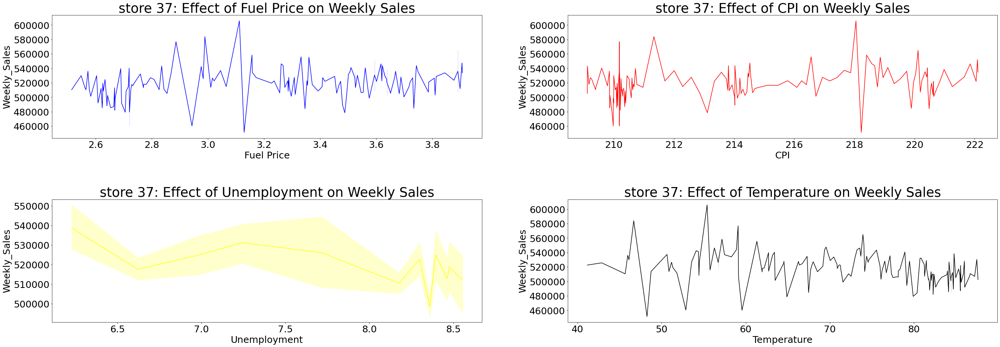

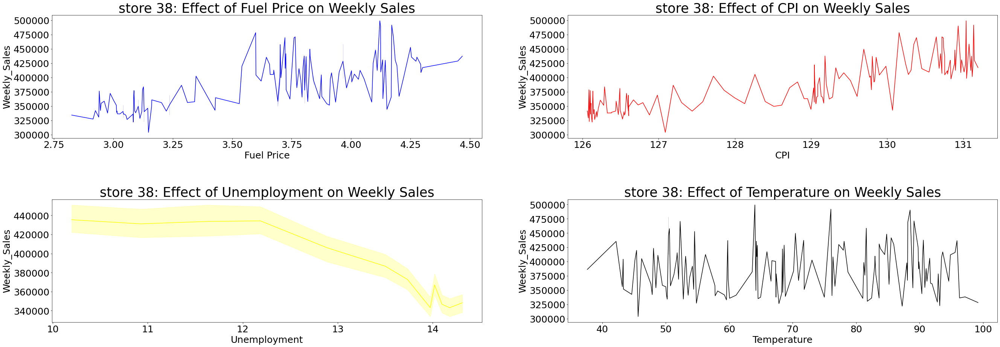

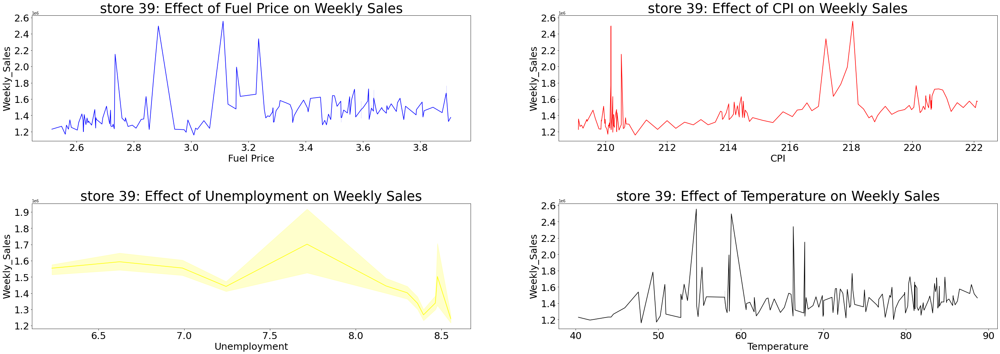

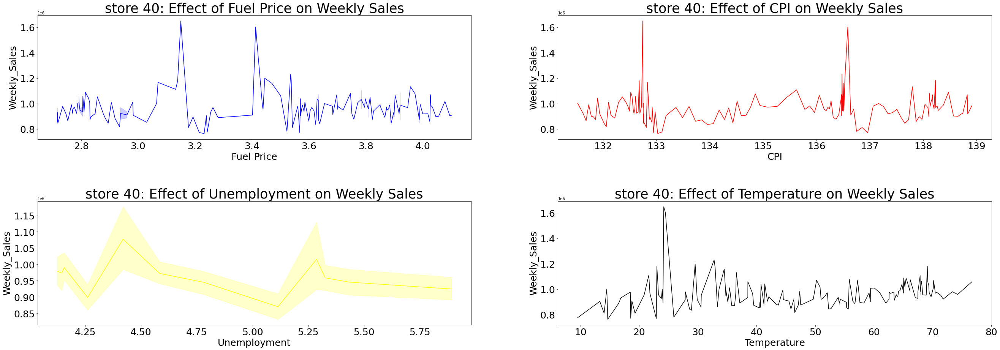

<Figure size 432x288 with 0 Axes>

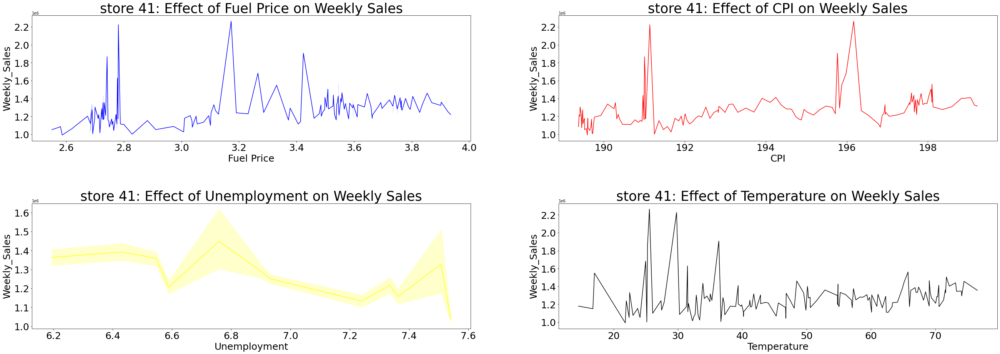

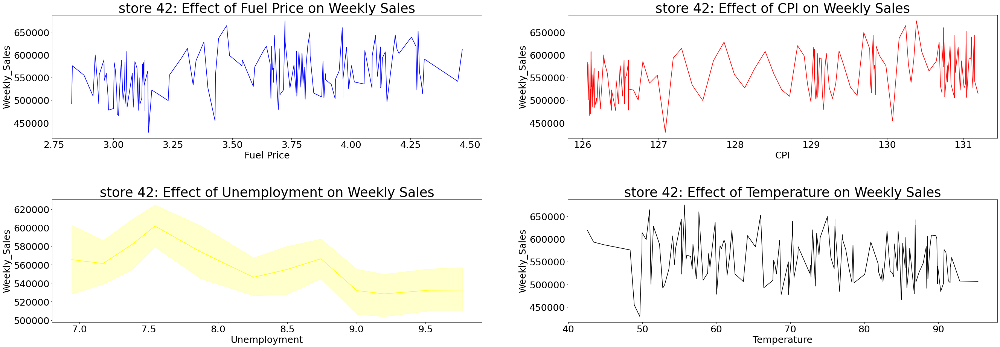

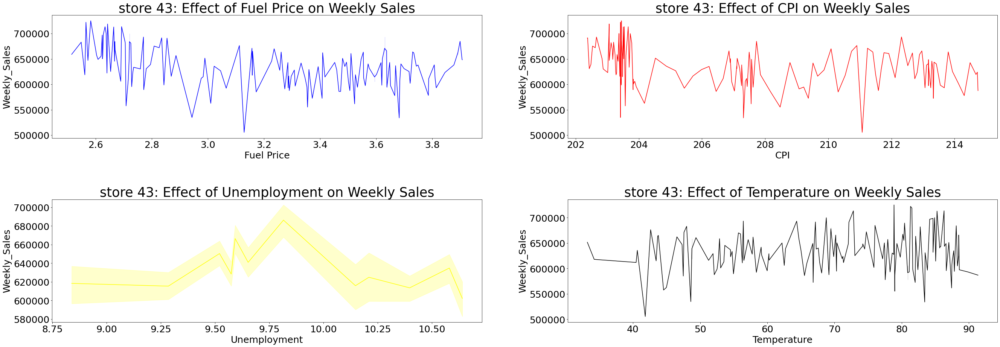

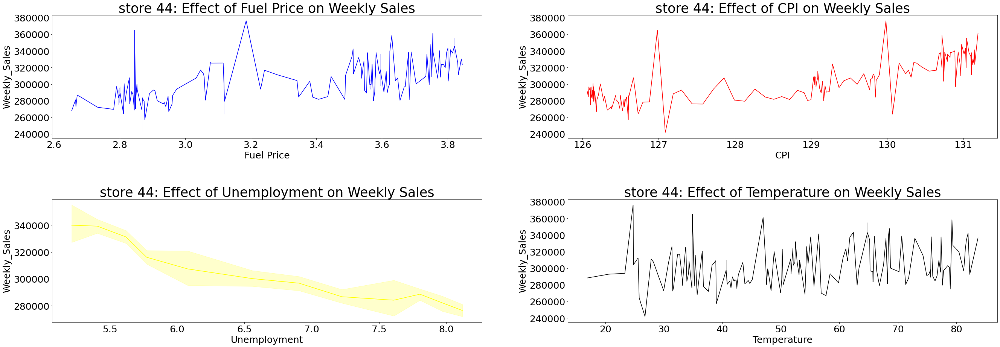

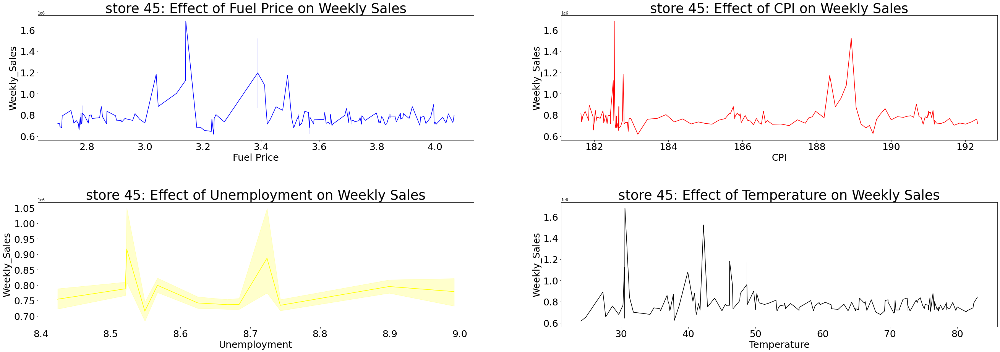

In [51]:
#Temperature,Unemployment,CPI and Fuel_price on stores 1-45
plot_features_effect(range(1,11))
plot_features_effect(range(11,21))
plot_features_effect(range(21,31))
plot_features_effect(range(31,41))
plot_features_effect(range(41,46))

# Observations

Its observed that the effect of the independent features:
Holiday_Flag, Unemployment, Temperature, CPI, Fuel_Price on Weekly_Sales varies for each store


for example, Stores 33,34,35 and 36 show positive correlation with unemployment, which implies that as the unemployment increases, the Weekly_Sales for the stores increases

For this reason, it will be necessary to design the model for prediction & forecast for each store seperately

# Step 3: Time Series Model

Check for Stationarity

In [52]:
# To check if Data is Stationary or not we have to do Dicky-Fuller Test
#   Check for p value from Dicky Fuller test:
#       if p-value > 0.05 it means data is non stationary
#       if p-value < 0.05 it means data is stationary

In [54]:
print(store_list)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45]


In [56]:
#Check and isolate all Stores with non-stationarity TS

store_x,store_y = [],[]
p_value_x,p_value_y =[],[]
Test_stat_x,Test_stat_y =[],[]

found_p_value = False

for i in store_list:
    store_df=get_store_df(df,'Store',i)
    adft = adfuller(store_df['Weekly_Sales'],autolag='AIC')
    
    Values = [adft[0],adft[1],adft[2],adft[3],adft[4]["1%"], adft[4]["5%"], adft[4]["10%"]]
    
    p_value = adft[1]
    Test_stat = adft[0]
    
    if p_value > 0.05:
        found_p_value
        store_x.append(i)
        p_value_x.append(p_value)
        Test_stat_x.append(Test_stat)
    else:
        store_y.append(i)
        p_value_y.append(p_value)
        Test_stat_y.append(Test_stat)
    
#if found_p_value:
xstores=pd.DataFrame(zip(store_x,p_value_x,Test_stat_x),
                    columns=['Store','p-value','Test Statistics'])
ystores=pd.DataFrame(zip(store_y,p_value_y,Test_stat_y),
                    columns=['Store','p-value','Test Statistics'])   


print(f"\nNON Stationary TS (Stores):\n    Dickyfuller Test results for p-values greater than 0.05\n{xstores}")
print(f"\n Stationary TS (Stores):\n    Dickyfuller Test results for p-values less than 0.05\n{ystores}")


NON Stationary TS (Stores):
    Dickyfuller Test results for p-values greater than 0.05
   Store   p-value  Test Statistics
0     14  0.067870        -2.736887
1     30  0.168364        -2.311254
2     36  0.973016         0.213632
3     38  0.916563        -0.360017
4     42  0.457285        -1.649531
5     43  0.106059        -2.539930
6     44  0.759162        -0.983703

 Stationary TS (Stores):
    Dickyfuller Test results for p-values less than 0.05
    Store       p-value  Test Statistics
0       1  1.387779e-05        -5.102186
1       2  3.990207e-03        -3.708863
2       3  3.840926e-02        -2.963868
3       4  4.779866e-02        -2.879382
4       5  4.251706e-04        -4.310974
5       6  2.159486e-06        -5.492502
6       7  2.170072e-04        -4.476254
7       8  1.002746e-06        -5.647653
8       9  2.134309e-05        -5.008564
9      10  8.763068e-06        -5.200703
10     11  3.316837e-03        -3.762354
11     12  1.045184e-06        -5.639346
12     

In [57]:
#As shown above, 7 stores have non-stationary TS & 38 stores have stationary TS

st_TS = ystores['Store'].tolist()
non_st_TS = xstores['Store'].tolist()

print(f"{len(non_st_TS)} Stores: {non_st_TS}")
print(" have their p-value greater than 0.05 ==> non-statinary TS")


7 Stores: [14, 30, 36, 38, 42, 43, 44]
 have their p-value greater than 0.05 ==> non-statinary TS


In [58]:
#Stores with Stationary TS
print(f"{len(st_TS)} Stores: {st_TS}")
print(" have their p-value lesser than 0.05 ==> statinary TS")

38 Stores: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 37, 39, 40, 41, 45]
 have their p-value lesser than 0.05 ==> statinary TS


In [59]:
#Select top 10 stores from the list with stationary TS for analysis & general inference

Highest_Weekly_Sales=df.groupby(['Store'])['Weekly_Sales'].sum().reset_index().sort_values('Weekly_Sales', ascending=False)

Highest_Weekly_Sales.head()



,Store,Weekly_Sales
19,20,3.013978e+08
3,4,2.995440e+08
13,14,2.889999e+08
12,13,2.865177e+08
1,2,2.753824e+08


In [60]:
# List of Stores in ascending order of Total_Weekly_Sales

stationary_stores = Highest_Weekly_Sales['Store'].tolist()
print(stationary_stores)

[20, 4, 14, 13, 2, 10, 27, 6, 1, 39, 19, 31, 23, 24, 11, 28, 41, 32, 18, 22, 12, 26, 34, 40, 35, 8, 17, 45, 21, 25, 43, 15, 7, 42, 9, 29, 16, 37, 30, 3, 38, 36, 5, 44, 33]


In [61]:
#Extract stationary_list from store_list

xcount=0
stationary_list=[]

for i, store in enumerate(stationary_stores):
    if store in non_st_TS:
        continue
    elif xcount <= len(stationary_stores):
        stationary_list.append(store)
        xcount +=1

print(f"The Stationary Stores: {stationary_list}")

The Stationary Stores: [20, 4, 13, 2, 10, 27, 6, 1, 39, 19, 31, 23, 24, 11, 28, 41, 32, 18, 22, 12, 26, 34, 40, 35, 8, 17, 45, 21, 25, 15, 7, 9, 29, 16, 37, 3, 5, 33]


In [62]:
highest_10,highest_5,highest_6=[],[],[]

highest_5 = stationary_list[0:5]
highest_6 = stationary_list[0:6]
highest_10 = stationary_list[0:10]
highest_12 = stationary_list[0:12]

print(f"\nHighest 5 Stores: {highest_5} \nHighest 6 Stores: {highest_6} \nHighest 10 Stores: {highest_10}")
print(f"Highest 12 Stores: {highest_12}")


Highest 5 Stores: [20, 4, 13, 2, 10] 
Highest 6 Stores: [20, 4, 13, 2, 10, 27] 
Highest 10 Stores: [20, 4, 13, 2, 10, 27, 6, 1, 39, 19]
Highest 12 Stores: [20, 4, 13, 2, 10, 27, 6, 1, 39, 19, 31, 23]


In [63]:
#Dickey Fuller Test for the Ten Stores with Highest Weekly Sales

In [64]:
# Dickey Fuller Test

from statsmodels.tsa.stattools import adfuller


# Find Best ARIMA Order for the Selected Stores

In [65]:
# Recall the five highest performing Stores:
highest_6

[20, 4, 13, 2, 10, 27]

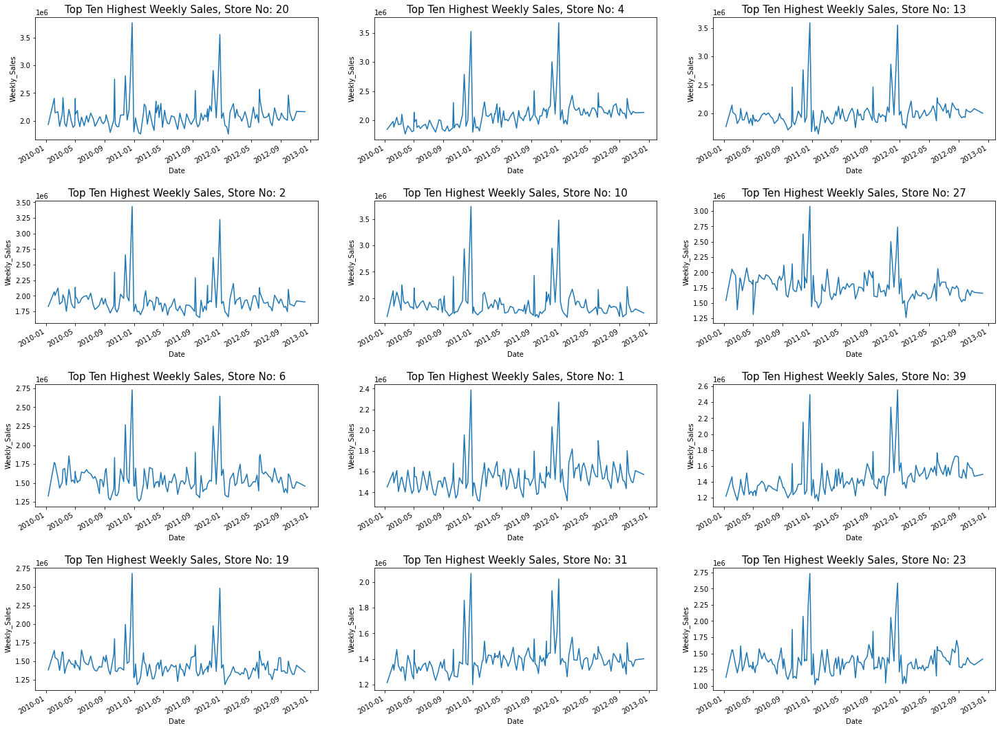

In [66]:
# Series plot of the 12 stores ith highest weekly_Sales

fig, axes = plt.subplots(4,3, figsize = (25,20))
plt.subplots_adjust(hspace = 0.5)

j=1
for i in highest_12:
    store_df=get_store_df(df,'Store',i)
    
    plt.subplot(4,3,j)
    store_df['Weekly_Sales'].plot();
    plt.title("Top Ten Highest Weekly Sales, Store No: "+str(i),fontsize = 15)
    plt.ylabel("Weekly_Sales", fontsize =10)
    j=j+1

In [67]:
#Find the best ARIMA order for the 10 highest performing stores

In [68]:
import numpy as np
import pmdarima
from pmdarima import auto_arima
import statsmodels.api as sm

In [69]:
def format_number(number):
    return("{:,}".format(number))

In [70]:
for i in highest_10:
    print(f"Highest Weekly_Sales: Best order for ARIMA model for #{i}")
    store_df=get_store_df(df,'Store',i)
    multiplemodels = auto_arima(store_df['Weekly_Sales'], trace = True)
    print("\n________________________________________________________")

Highest Weekly_Sales: Best order for ARIMA model for #20
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3974.854, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3991.763, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3971.424, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3977.707, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4574.703, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3972.263, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=3972.813, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3974.255, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 1.047 seconds

________________________________________________________
Highest Weekly_Sales: Best order for ARIMA model for #4
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3941.121, Time=0.26 sec
 ARIMA(0,1,

In [71]:
highest_10

[20, 4, 13, 2, 10, 27, 6, 1, 39, 19]

# Predictions

In [72]:
def get_predictions(actual, predicted):
    predict_dbf =pd.DataFrame(zip(actual,predicted),
                             columns =['Actual','Predicted'])
    predict_dbf['Error(%)'] = abs(predict_dbf.Actual-predict_dbf.Predicted)*100/predict_dbf.Actual
    predict_dbf = predict_dbf.sort_values(by=['Error(%)']).reset_index()
    del predict_dbf['index']
    
    print("\n=========================Predicted Results==============================")
    print(predict_dbf.head(),"\n________________________________________________________")
    print(f"Median error: {round(predict_dbf['Error(%)'].median(),2)}%")
    print(f"Mean   error: {round(predict_dbf['Error(%)'].mean(),2)}%")
    print("______________________________________________________\n")
    
    return (predict_dbf)

In [73]:
# ARIMA Predictions

ARIMA_order=[[2,1,3],[1,0,0],[2,0,0],[5,1,1]]
predictions=list() # initialize list of predictedvdatabase results
Arima_X_train, Arima_X_test =[],[]
test_index_list=[]
train_index_list=[]

for i in highest_10:
    store_df=get_store_df(df,'Store',i)
    
    size=int(store_df.shape[0]*0.80)  #size for train,test,split the data @70:30
    train, test = store_df.iloc[:size,:], store_df.iloc[size:,:]
    
    Arima_X_train.append(train)
    Arima_X_test.append(test)
    train_index =train.index
    test_index =test.index
    Arima_test_index =test.index
    Arima_train_index =train.index
    
    start_1 = train.shape[0]
    end_1 =(train.shape[0] + test.shape[0])-1
    Actual_1 = test['Weekly_Sales']
    predict_index=Actual_1.index
    Actual_2 = Actual_1.tolist()
    
    if i==1 or i==4:
        arima = ARIMA_order[0]
        
    elif i==2 or i==13 or i==20:
        arima = ARIMA_order[1]
        
    elif i==10 or i==27:
        arima = ARIMA_order[2]
        
    elif i==39:
        arima = ARIMA_order[3]
        
    print(f"\nResults for Store #{i}\n Best ARIMA Order: {arima}")
    model = ARIMA(train['Weekly_Sales'], order = arima)
    model_fit = model.fit()
    print(model_fit.summary())
    
    predicted_1 = model_fit.predict(start =start_1, end = end_1)
    predicted_2 = pd.DataFrame()
    predicted_2['Weekly_Sales']=predicted_1
    predicted_2.index=predict_index
    
    test_index_list.append(test.index)
    train_index_list.append(train.index)
    
    predictions.append(get_predictions(Actual_2,predicted_1.tolist())) #store the predictions in a list
    
Arima_predict = predictions  # store the predictions for later use



Results for Store #20
 Best ARIMA Order: [1, 0, 0]
                               SARIMAX Results                                
Dep. Variable:           Weekly_Sales   No. Observations:                  114
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -1591.241
Date:                Sat, 08 Apr 2023   AIC                           3188.483
Time:                        15:05:45   BIC                           3196.692
Sample:                             0   HQIC                          3191.814
                                - 114                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.115e+06   5.73e+04     36.909      0.000       2e+06    2.23e+06
ar.L1          0.3927      0.046      8.558      0.000       0.303       0.483


In [74]:
Arima_X_test[0].head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2012-04-13,20,2045396.06,0,45.68,4.044,214.312703,7.139
2012-04-20,20,1884427.84,0,60.11,4.027,214.367504,7.139
2012-04-27,20,1886503.93,0,47.64,4.004,214.422306,7.139
2012-04-05,20,2163510.89,0,62.74,3.951,214.477108,7.139
2012-11-05,20,2168097.11,0,63.19,3.889,214.531910,7.139


# Plot Predictions

Helper Functions

In [75]:
def plot_predictions(predictions,name,store_no):
    
    fig, axes = plt.subplots(figsize =(20,6))
    sns.lineplot(x =predictions.index, y=predictions['Actual'], color ='red', legend=True)
    sns.lineplot(x =predictions.index, y=predictions['Predicted'], color ='blue', legend=True)
    plt.title(f"STORE NO: {store_no} ----> {name}Predictions", fontsize =25)
    plt.xlabel("Date", fontsize = 15)
    plt.ylabel("Weekly Sales", fontsize =15)
    plt.legend(['Actual','Predicted'],loc='best')
    plt.grid(True)
    plt.show

In [76]:
def plot_ts_results(predict_df,df_index,model,l=5,w=2,wl=20,ww=10,hs=1.5):
    fig, axes = plt.subplots(l,w,figsize=(wl,ww))
    
    plt.subplots_adjust(hspace = hs)
    
    for i in range(len(predict_df)):
        store_df =predict_df[i]
        
        plt.subplot(l,w,i+1)
        sns.lineplot(x=store_df.index, y=store_df.Actual)
        sns.lineplot(x=store_df.index, y=store_df.Predicted)
        
        plt.title(f"{model}: Prediction Plot for Store {highest_10[i]}", fontsize =25)
        plt.xlabel("Dates", fontsize =15)
        plt.ylabel("Predicted Weekly Sales", fontsize =15)
        plt.legend(['Actual','Predicted'],loc = 'best')
        plt.grid(True)
        

In [77]:
#Recall list of DataFrame predictions for the top 5 sales store
len(predictions)

10

In [78]:
test_index_list[0]

DatetimeIndex(['2012-04-13', '2012-04-20', '2012-04-27', '2012-04-05',
               '2012-11-05', '2012-05-18', '2012-05-25', '2012-01-06',
               '2012-08-06', '2012-06-15', '2012-06-22', '2012-06-29',
               '2012-06-07', '2012-07-13', '2012-07-20', '2012-07-27',
               '2012-03-08', '2012-10-08', '2012-08-17', '2012-08-24',
               '2012-08-31', '2012-07-09', '2012-09-14', '2012-09-21',
               '2012-09-28', '2012-05-10', '2012-12-10', '2012-10-19',
               '2012-10-26'],
              dtype='datetime64[ns]', name='Date', freq=None)

In [79]:
Predictions=list()
for i in range(len(predictions)):
    predictions[i].index=test_index_list[i]
    predictions.append(predictions[i][['Actual','Predicted','Error(%)']])

In [80]:
Store_20_pred =predictions[0][['Actual','Predicted','Error(%)']]


In [81]:
Store_20_pred.head(10)

,Actual,Predicted,Error(%)
Date,,,
2012-04-13,2114989.00,2.115621e+06,0.029899
2012-04-20,2134680.12,2.114974e+06,0.923133
2012-04-27,2094515.71,2.114973e+06,0.976722
2012-04-05,2143126.59,2.115228e+06,1.301783
2012-11-05,2144245.39,2.114973e+06,1.365148
2012-05-18,2080529.06,2.114973e+06,1.655550
2012-05-25,2163510.89,2.125678e+06,1.748681
2012-01-06,2162951.36,2.114973e+06,2.218178
2012-08-06,2168097.11,2.119177e+06,2.256379


Predictions[0].head(10) # predictions for store 20

ValueError: num must be 1 <= num <= 10, not 11

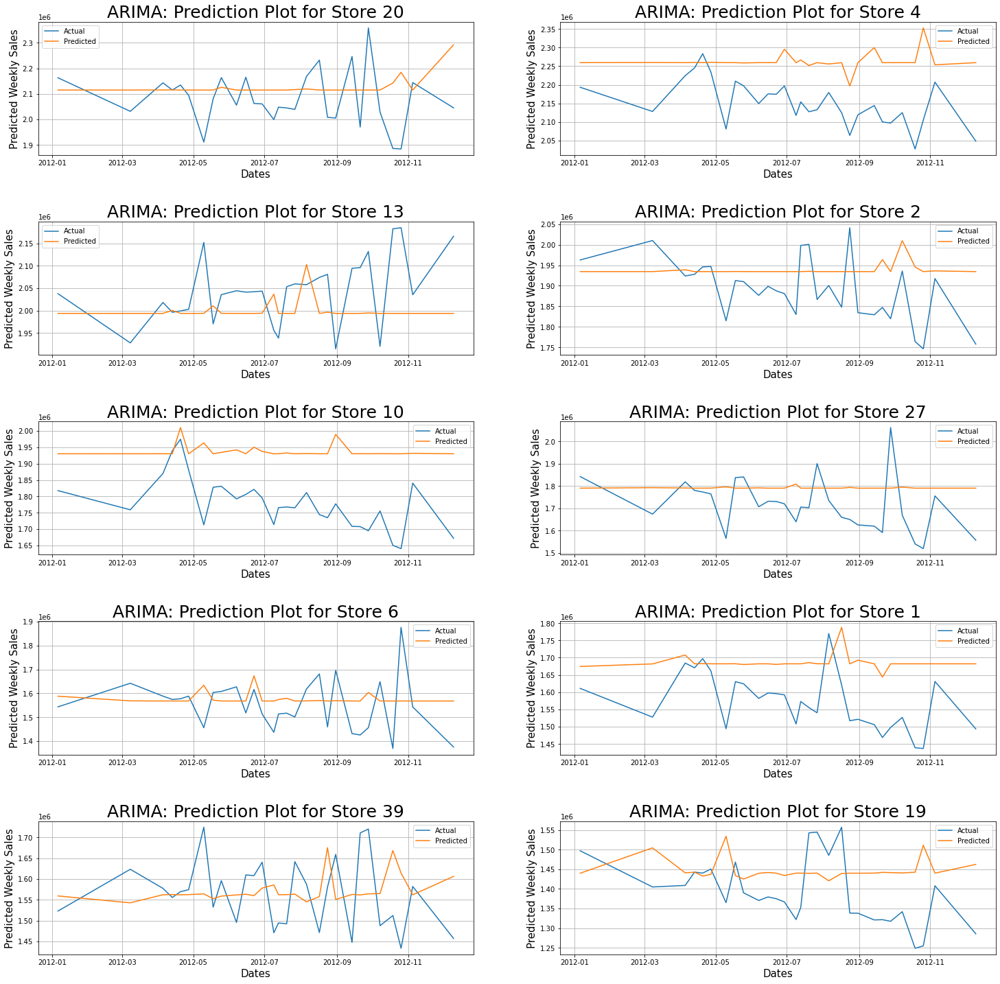

In [82]:
#plot prediction
plot_ts_results(predictions,test_index, "ARIMA", 5,2,25,25,.5)

In [83]:
#Extract the predictions for the top 5
Store_2_pred =predictions[0][['Actual','Predicted','Error(%)']]
Store_4_pred =predictions[1][['Actual','Predicted','Error(%)']]
Store_10_pred =predictions[2][['Actual','Predicted','Error(%)']]
Store_13_pred =predictions[3][['Actual','Predicted','Error(%)']]
Store_20_pred =predictions[4][['Actual','Predicted','Error(%)']]

In [84]:
# predictions for store #2 in list index position 0
Store_2_pred.head()

,Actual,Predicted,Error(%)
Date,,,
2012-04-13,2114989.00,2.115621e+06,0.029899
2012-04-20,2134680.12,2.114974e+06,0.923133
2012-04-27,2094515.71,2.114973e+06,0.976722
2012-04-05,2143126.59,2.115228e+06,1.301783
2012-11-05,2144245.39,2.114973e+06,1.365148


ValueError: num must be 1 <= num <= 10, not 11

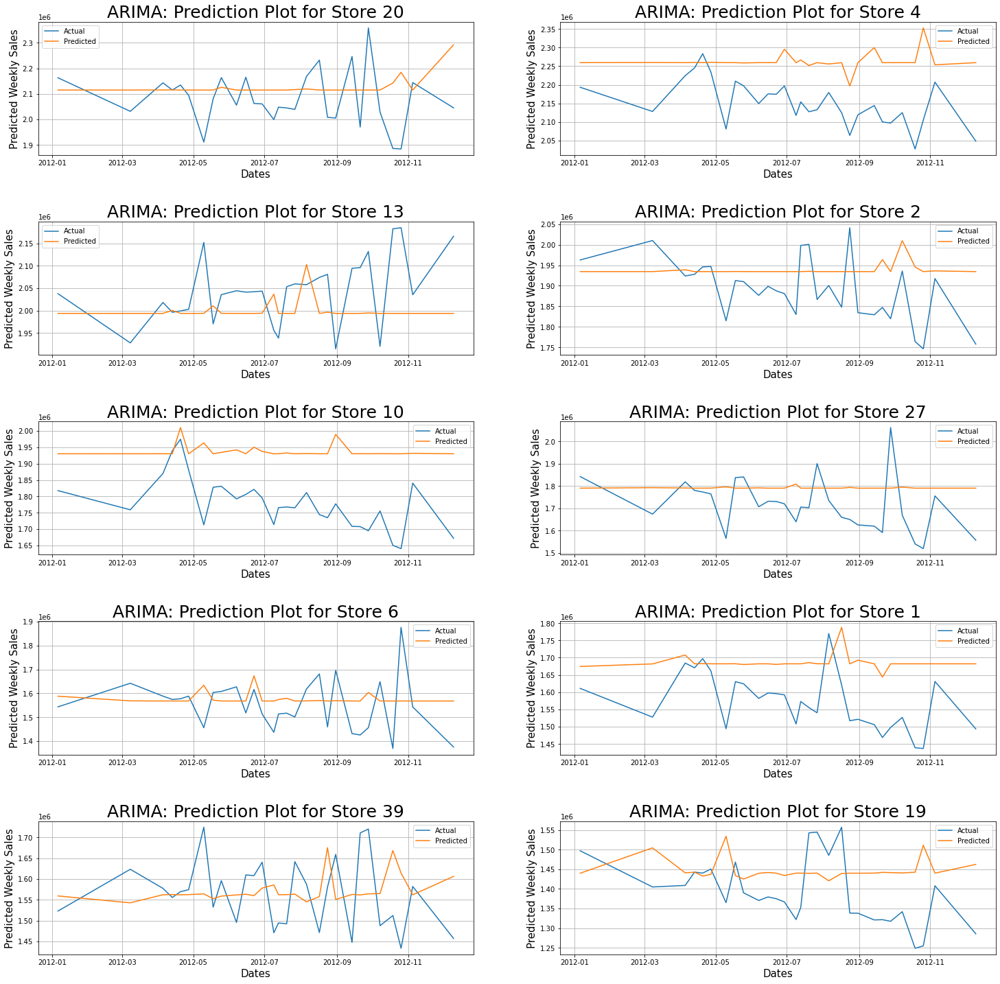

In [85]:
#plot prediction
plot_ts_results(predictions,test_index, "ARIMA", 5,2,25,25,.5)

# 12- Weeks Forecast


In [86]:
# Extract the last date for Store 2

Begin_date = str(Store_2.tail(1).index)
Begin_date

"DatetimeIndex(['2012-10-26'], dtype='datetime64[ns]', name='Date', freq=None)"

In [87]:
from datetime import datetime
from datetime import timedelta

Begin_date = "2012-10-26"
begin_date = datetime.strptime(Begin_date, "%Y-%m-%d")
End_date = begin_date + timedelta(days=84)

#print begin date

print(f"Begin_date: {Begin_date},\nEnd_date :{End_date}")

Begin_date: 2012-10-26,
End_date :2013-01-18 00:00:00


In [88]:
df[df['Store']==1].index[-1]

Timestamp('2012-10-26 00:00:00')

In [89]:
#Generate date range from Last date (Store_1) for 12-weeks

from datetime import datetime, timedelta  #import module in python
start_date = df[df['Store']==1].index[-1] +timedelta(weeks =5)
end_date = start_date + timedelta(weeks =12)

Index = pd.date_range(start_date, end=end_date, freq='W')

print(Index)

DatetimeIndex(['2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20',
               '2013-01-27', '2013-02-03', '2013-02-10', '2013-02-17'],
              dtype='datetime64[ns]', freq='W-SUN')


In [90]:
# set Index for prediction

No_of_wks =len(Index)
print(f"Number of Weeks ={No_of_wks}   |  {round(No_of_wks/52,2)}-years")

Number of Weeks =12   |  0.23-years


In [91]:
df.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-05-02,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-12-02,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-05-03,1,1554806.68,0,46.50,2.625,211.350143,8.106


In [92]:
from statsmodels.tsa.statespace.sarimax import SARIMAX, SARIMAXResults

In [93]:
def remove_outliers(dbf):
    dataset=sorted(dbf.Weekly_Sales)
    q1, q3 = np.percentile(dataset,[25,75])
    iqr = q3-q1
    lower_fence = q1-(1.5*iqr)
    upper_fence = q3+(1.5*iqr)
    return(dbf[dbf.Weekly_Sales < upper_fence])

In [94]:
#Forecast without Detrending
#SERIMA forecast without detrending

j=1

ARIMA_order =[[2,1,3],[1,0,0],[2,0,0],[5,1,1]]
season_order=[[2,1,3,7],[1,0,0,7],[2,0,0,7],[5,1,1,7]]
Forecast_1 = pd.DataFrame()
forecast_1 = list()
current_df,predicted_list = [],[]
train_index_list,test_index_list = [],[]
predictions, forecast_list = [],[]

for i in highest_10:
    store_df=get_store_df(df,'Store',i)   #original TS
    store_index=store_df.index
    store_df=pd.DataFrame(store_df['Weekly_Sales'],
                         columns=['Weekly_Sales'],index=store_index)
    
    #remove outliers
    store_df = remove_outliers(store_df)
    
    size=int(store_df.shape[0]*0.75)   #size for train,test split the data @75:25
    train, test = store_df.iloc[:size,:], store_df.iloc[size:,:]
    
    start_1 = train.shape[0]
    end_1 =(train.shape[0] + test.shape[0])-1
    
    train_index=train.index
    test_index=test.index
    
    if i==1 or i==4:
        arima_order = ARIMA_order[0]
        Season_order = season_order[0]
        
    elif i==2 or i==13 or i==20:
        arima_order = ARIMA_order[1]
        Season_order = season_order[1]
        
    elif i==10 or i==27:
        arima_order = ARIMA_order[2]
        Season_order = season_order[2]
        
    elif i==39:
        arima_order = ARIMA_order[3]
        Season_order = season_order[3]
    
    model = SARIMAX(train, order=arima_order, Seasonal_order=season_order,
                   initialization='approximate_diffuse')
    #model fit
    model = model.fit()
    
    forecast = model.forecast(steps = No_of_wks).tolist()  #12 week forecast
    forecast_1.append(forecast)   # store each forecast in a list
    forecast_list.append(forecast)

    
    #Forecasts
    forecast = pd.DataFrame(forecast, columns=['Weelky_Sales'], index=Index)
    current_df.append(train)
    train_index_list.append(train.index)
    test_index_list.append(test.index)
    
    
    #predictions
    predicted_ = model.predict(start=start_1, end=end_1, dynamic =True)
    predicted_list.append(predicted_)
    
    print()
    print(f'Weekly Sales Predictions for Store {i}')
    predictions.append(get_predictions(test.values.flatten(),predicted_)) #store the predictions in a list

       


Weekly Sales Predictions for Store 20

=========================Predicted Results==============================
       Actual     Predicted  Error(%)
0  1992436.96  1.997302e+06  0.244196
1  2064991.71  2.009327e+06  2.695630
2  1886503.93  1.949919e+06  3.361498
3  2045396.06  1.973468e+06  3.516566
4  1884427.84  1.961658e+06  4.098345 
________________________________________________________
Median error: 11.95%
Mean   error: 11.54%
______________________________________________________


Weekly Sales Predictions for Store 4

=========================Predicted Results==============================
       Actual     Predicted  Error(%)
0  2154137.67  2.156914e+06  0.128877
1  2149594.46  2.156915e+06  0.340556
2  2144336.89  2.157051e+06  0.592899
3  2174514.13  2.156915e+06  0.809334
4  2175563.69  2.156915e+06  0.857187 
________________________________________________________
Median error: 2.39%
Mean   error: 2.74%
______________________________________________________


Weekly S

In [95]:
Predictions=list()
for i in range(len(predictions)):
    predictions[i].index=test_index_list[i]
    predictions.append(predictions[i][['Actual', 'Predicted', 'Error(%)']])

In [96]:
Store_20_pred =predictions[0][['Actual','Predicted','Error(%)']]

In [97]:
Store_20_pred.head(10)

,Actual,Predicted,Error(%)
Date,,,
2012-02-03,1992436.96,1.997302e+06,0.244196
2012-09-03,2064991.71,2.009327e+06,2.695630
2012-03-16,1886503.93,1.949919e+06,3.361498
2012-03-23,2045396.06,1.973468e+06,3.516566
2012-03-30,1884427.84,1.961658e+06,4.098345
2012-04-13,2074721.74,1.985350e+06,4.307668
2012-04-20,2148822.76,2.033594e+06,5.362399
2012-04-27,2139265.40,2.021424e+06,5.508483
2012-04-05,1911559.10,1.803548e+06,5.650415


ValueError: num must be 1 <= num <= 10, not 11

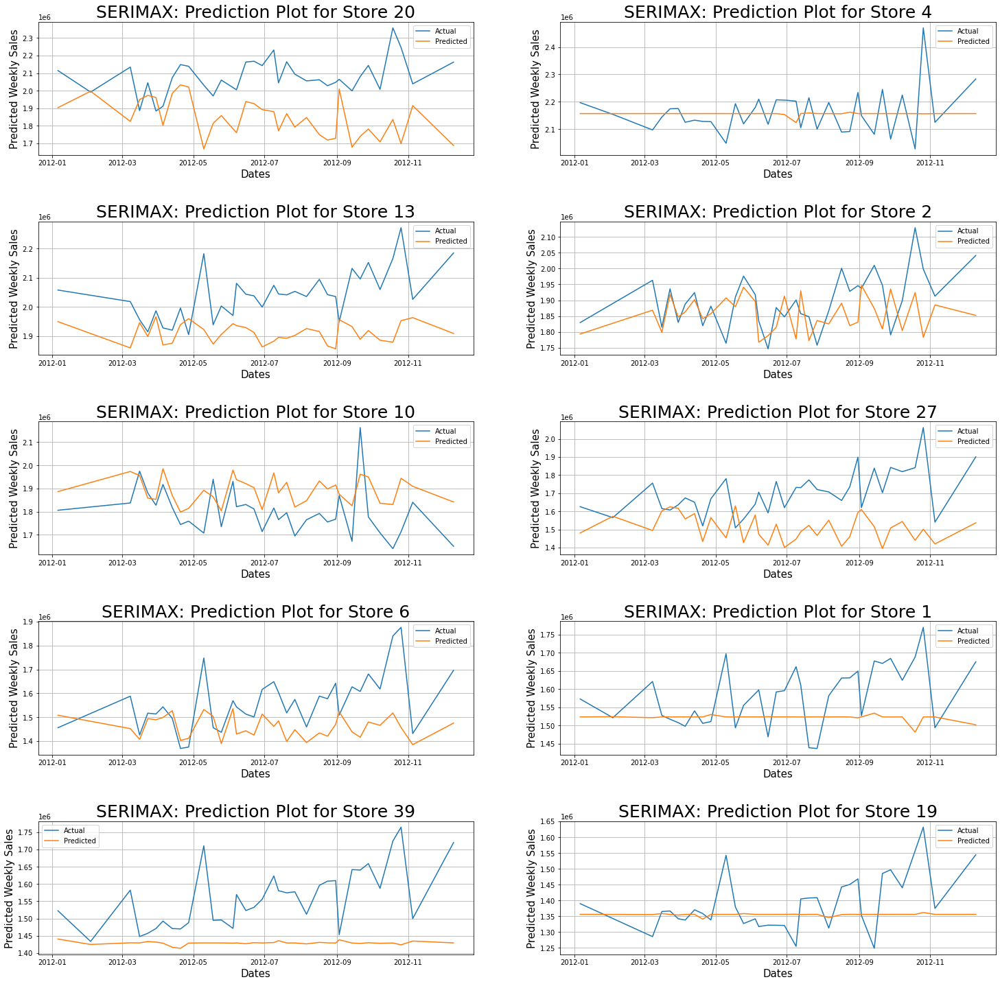

In [98]:
#plot prediction
plot_ts_results(predictions,test_index, "SERIMAX", 5,2,wl=25,ww=25,hs=.5)

In [99]:
def plot_ts_forecast(forecast_,Index, Train_df, l=5,w=2,wl=20,ww=10,hs=1.5, plot_current=0):
    fig, axes = plt.subplots(l,w, figsize=(wl,ww))
    plt.subplots_adjust(hspace =hs)
    j=1
    
    for i, store_no in enumerate(highest_10):
        forecast_df = pd.DataFrame(forecast_[i], columns=['Forecast'], index=Index)
        train_df = pd.DataFrame(Train_df[i], columns=['Weekly_Sales'], index=train.index)
        
        plt.subplot(l,w,j)
        sns.lineplot(x=forecast_df.index, y=forecast_df.Forecast)
        if plot_current==1:
            sns.lineplot(x=train_df.index, y=train_df.Weekly_Sales)
            
        plt.title(f"{No_of_wks}-Weeks Forecast Plot for Store {store_no}", fontsize=25)
        plt.xlabel("Dates",fontsize=15)
        plt.ylabel("Forecast Weekly sales", fontsize =9)
        plt.grid(True)
       
        
        j=j+1

In [100]:
forecast_list[0]

[2033594.300051383,
 2021424.3194438748,
 2009327.1696994267,
 1997302.4149640482,
 1985349.621992103,
 1973468.3601306998,
 1961658.2013041754,
 1949918.7199986721,
 1938249.4932468066,
 1926650.10061243,
 1915120.1241754806,
 1903659.148516926]

In [101]:
# show forecast for the selected stores

Forecast =pd.DataFrame(index=Index)
for i in range(len(highest_10)):
    Forecast['store_'+str([highest_10[i]])]=forecast_1[i]
Forecast

,store_[20],store_[4],store_[13],store_[2],store_[10],store_[27],store_[6],store_[1],store_[39],store_[19]
2012-12-02,2.033594e+06,2.153654e+06,1.966296e+06,1.946835e+06,1.985446e+06,1.630296e+06,1.536278e+06,1.481931e+06,1.438257e+06,1.341316e+06
2012-12-09,2.021424e+06,2.124030e+06,1.962855e+06,1.941131e+06,1.979469e+06,1.625061e+06,1.532392e+06,1.502195e+06,1.416497e+06,1.345887e+06
2012-12-16,2.009327e+06,2.159076e+06,1.959421e+06,1.935444e+06,1.973536e+06,1.617063e+06,1.527473e+06,1.534128e+06,1.440308e+06,1.354105e+06
2012-12-23,1.997302e+06,2.162272e+06,1.955992e+06,1.929774e+06,1.967620e+06,1.609700e+06,1.522677e+06,1.530393e+06,1.413456e+06,1.358539e+06
2012-12-30,1.985350e+06,2.156292e+06,1.952570e+06,1.924120e+06,1.961722e+06,1.602242e+06,1.517885e+06,1.521226e+06,1.434498e+06,1.362089e+06
2013-01-06,1.973468e+06,2.156056e+06,1.949153e+06,1.918482e+06,1.955842e+06,1.594846e+06,1.513109e+06,1.521715e+06,1.423507e+06,1.358685e+06
2013-01-13,1.961658e+06,2.157061e+06,1.945742e+06,1.912862e+06,1.949979e+06,1.587479e+06,1.508348e+06,1.524311e+06,1.435584e+06,1.356769e+06
2013-01-20,1.949919e+06,2.157051e+06,1.942338e+06,1.907257e+06,1.944134e+06,1.580147e+06,1.503601e+06,1.524332e+06,1.424592e+06,1.355665e+06
2013-01-27,1.938249e+06,2.156884e+06,1.938939e+06,1.901669e+06,1.938306e+06,1.572849e+06,1.498870e+06,1.523606e+06,1.433057e+06,1.355583e+06
2013-02-03,1.926650e+06,2.156894e+06,1.935546e+06,1.896098e+06,1.932496e+06,1.565584e+06,1.494154e+06,1.523557e+06,1.426229e+06,1.355547e+06


In [102]:
Forecast.shape

(12, 10)

# Forecast Plot(Summary) - non Detrended TS

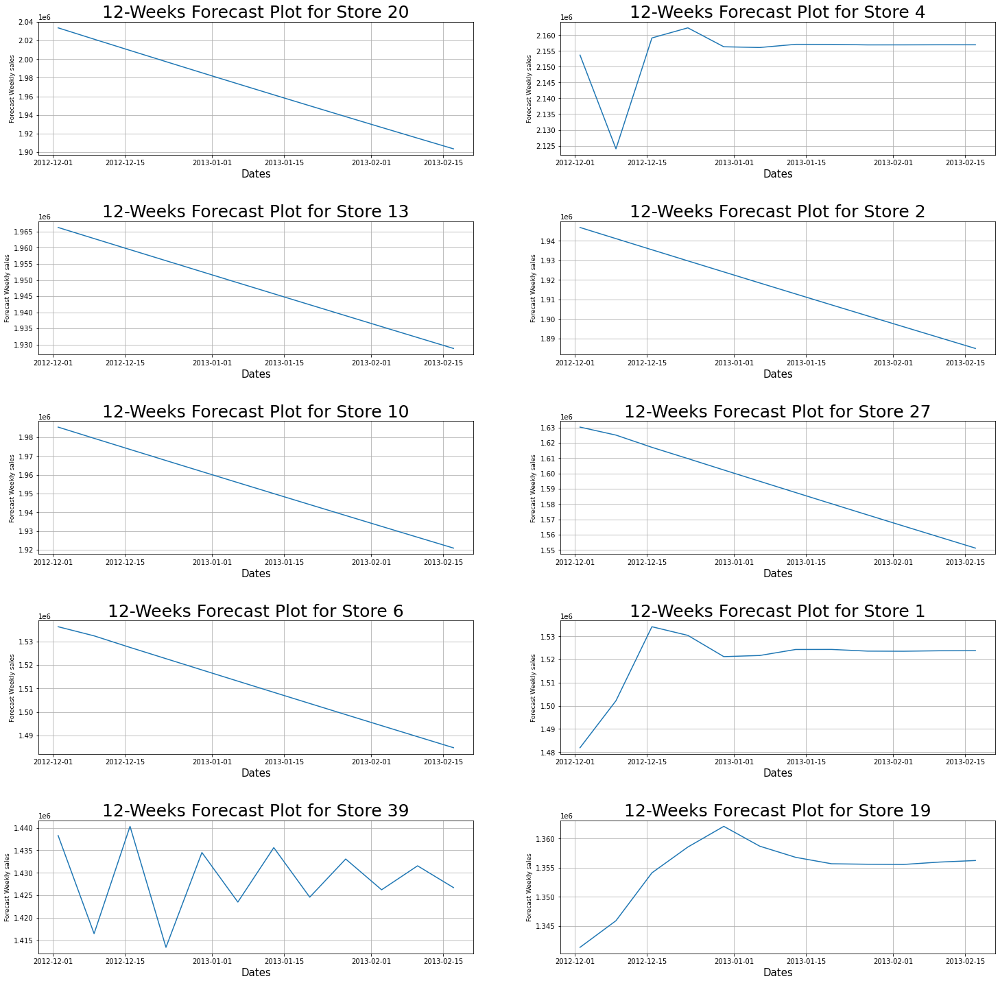

In [103]:
plot_ts_forecast(forecast_1,Index,current_df, 5,2,25,25,.5,0)

# Observations

1.The result of the forecast is highly affected by the size of the traning/testing dataset
2.Downward sales forecast for stores: 20,13,2, 27,10,6
3.Stores: [1,4,19,39] have similar trends in the forecast


In [104]:
# Reforecast for stores for the sunset of Stores with similare forecast trends
# Stores:[1,4,19,39]

In [105]:
df_new=df[((df['Store']==1) | (df['Store']==4) | (df['Store']==19) | (df['Store']==39))]
df_new.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-05-02,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-12-02,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-05-03,1,1554806.68,0,46.50,2.625,211.350143,8.106


In [106]:
df_new.shape

(572, 7)

In [107]:
# confirm the stores in df_new

new_store_list = df_new['Store'].unique()
new_store_list

array([ 1,  4, 19, 39], dtype=int64)

In [127]:
# Helper function 

def plot_new_forecasts(store_df,dbf=forecast):
    fig,axes=plt.subplots(figsize=(15,4))
    
    sns.lineplot(x =dbf.index, y=dbf.Weekly_Sales, color='green')
    sns.lineplot(x =store_df.index, y=store_df.Weekly_Sales, color='red')
    #plt.xticks(rotation=45)
    plt.title(f'{len(Index)} Week Forecast plot for Stores: {new_store_list}', fontsize=15)
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.grid(True)
    plt.show()
    

<AxesSubplot:xlabel='Weekly_Sales'>

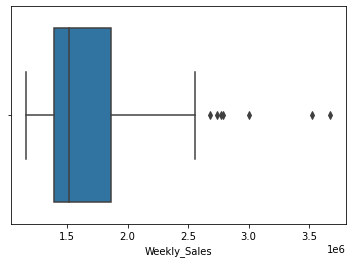

In [109]:
# check outliers on the Weekly_Sales
store_df=df_new.copy()
sns.boxplot(store_df['Weekly_Sales'])

In [110]:
# Remove Outliers
print(f"shape before {store_df.shape[0]} Outliers removal")
store_df = remove_outliers(store_df)
print(f"shape after {store_df.shape[0]} Outliers removal")

shape before 572 Outliers removal
shape after 565 Outliers removal


<AxesSubplot:xlabel='Weekly_Sales'>

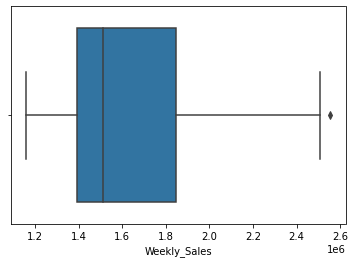

In [112]:
# Boxplot to re-check for ouliers on the weekly_Sales

sns.boxplot(store_df['Weekly_Sales'])

In [113]:
# obtain best ARIMA for store_df

multiplemodels = auto_arima(store_df['Weekly_Sales'], trace = True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=15143.062, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=15284.189, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=15212.213, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=15177.571, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=15282.190, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=15179.601, Time=0.23 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=15152.749, Time=0.26 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=15141.731, Time=0.34 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=15145.999, Time=0.34 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=15127.209, Time=0.60 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=15146.634, Time=0.32 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=15106.733, Time=0.71 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=15106.081, Time=0.65 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=15139.479, Time=0.30 sec
 ARIMA(4,1,0)(0,0,0

In [117]:
# Forecast for the new_df
#SERIMA forecast without detrending

arima_order =[5,1,1]
season_order =[5,1,1,7]

store_index=store_df.index
store_df=pd.DataFrame(store_df['Weekly_Sales'],
                     columns=['Weekly_Sales'],index=store_index)
size=int(store_df.shape[0]*0.75)   #size for train,test split the data @75:25
train,test = store_df.iloc[:size,:], store_df.iloc[size:,:]

start_1 =train.shape[0]
end_1 = (train.shape[0] + test.shape[0])-1

train_index = train.index
test_index = test.index

model = SARIMAX(train,order=arima_order, seasonal_order=Season_order,
               initialization ='approximate_diffuse')
model = model.fit()

forecast =model.forecast(steps = No_of_wks).tolist()   #5-year forecast
forecast = pd.DataFrame(forecast, columns=['Weekly_Sales'], index=Index)

current_df=train
predicted_ = model.predict(start =start_1, end=end_1, dynamic=True)

Predicted =get_predictions(test.values.flatten(),predicted_)    #store the prediction in a list


=========================Predicted Results==============================
       Actual     Predicted  Error(%)
0  1280414.80  1.276363e+06  0.316416
1  1219583.91  1.224161e+06  0.375321
2  1235094.66  1.228654e+06  0.521480
3  1308222.24  1.319192e+06  0.838540
4  1158698.44  1.148572e+06  0.873921 
________________________________________________________
Median error: 25.21%
Mean   error: 24.79%
______________________________________________________



In [118]:
forecast

,Weekly_Sales
2012-12-02,1.241924e+06
2012-12-09,1.288254e+06
2012-12-16,1.326145e+06
2012-12-23,1.328022e+06
2012-12-30,1.383022e+06
2013-01-06,1.314942e+06
2013-01-13,1.228654e+06
2013-01-20,1.248187e+06
2013-01-27,1.297273e+06
2013-02-03,1.308276e+06


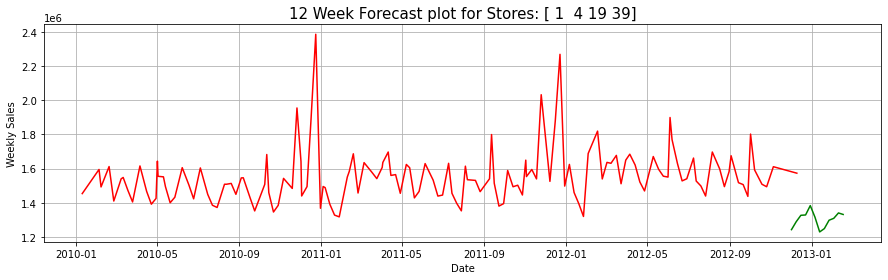

In [128]:
plot_new_forecasts(df_new[df_new['Store']==1])

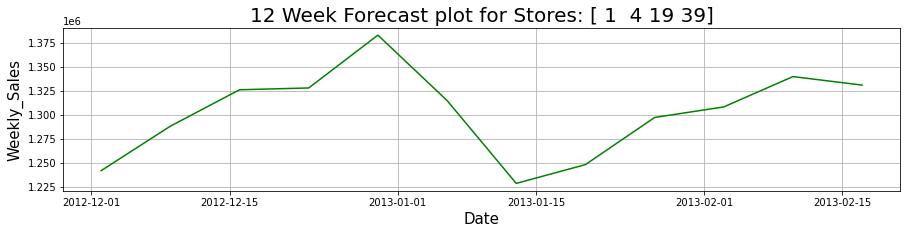

In [130]:
# Expand the Sales forecast plot:

fig, axes =plt.subplots(figsize=(15,3))
sns.lineplot(x= forecast.index, y=forecast.Weekly_Sales, color='green')
plt.title(f'{len(Index)} Week Forecast plot for Stores: {new_store_list}', fontsize=20)
plt.xlabel('Date',fontsize=15)
plt.ylabel('Weekly_Sales',fontsize=15)
plt.grid(True)
plt.show()

In [132]:
Max =format_number(round(forecast.Weekly_Sales.max(),2))
Min =format_number(round(forecast.Weekly_Sales.min(),2))
Mean =format_number(round(forecast.Weekly_Sales.mean(),2))
Summary = pd.DataFrame([Max,Min,Mean], columns=['Summary_Matrics'],index=['Max','Min','Mean'])
Summary

,Summary_Matrics
Max,"1,383,022.43"
Min,"1,228,653.89"
Mean,"1,302,962.85"


In [133]:
# Extract the Max,Min and mean sales Forecast for the Stores:

Summary_1=pd.DataFrame(index=['Max','Min','Mean'])

for store_no in new_store_list:
    store_df=get_store_df(df,'Store',store_no)
    max_sales =format_number(round(store_df.Weekly_Sales.max(),2))
    min_sales =format_number(round(store_df.Weekly_Sales.min(),2))
    mean_sales =format_number(round(store_df.Weekly_Sales.mean(),2))
    matrics =[max_sales,min_sales,mean_sales]
    
    Summary_1['Store_' +str(store_no)] = matrics
Summary_1


,Store_1,Store_4,Store_19,Store_39
Max,"2,387,950.2","3,676,388.98","2,678,206.42","2,554,482.84"
Min,"1,316,899.31","1,762,539.3","1,181,204.53","1,158,698.44"
Mean,"1,555,264.4","2,094,712.96","1,444,999.04","1,450,668.13"


In [ ]:
Summary_1['Summary_Matrics'] = Summary['Summary_Matrics']
Summary_1=Summary_1[['Summary_Matrics','store_1','store_4','store_19','store_39']]

In [135]:
Summary_1.T

,Max,Min,Mean
Store_1,"2,387,950.2","1,316,899.31","1,555,264.4"
Store_4,"3,676,388.98","1,762,539.3","2,094,712.96"
Store_19,"2,678,206.42","1,181,204.53","1,444,999.04"
Store_39,"2,554,482.84","1,158,698.44","1,450,668.13"
Summary_Matrics,"1,383,022.43","1,228,653.89","1,302,962.85"


# Insights from the forecast results

1. There is a lower sales forecast for all the stores for the next 12-weeks
2. All the stores under review will perform better than their mean sales return

In [136]:
# show predicted df
Predicted

,Actual,Predicted,Error(%)
0,1280414.80,1.276363e+06,0.316416
1,1219583.91,1.224161e+06,0.375321
2,1235094.66,1.228654e+06,0.521480
3,1308222.24,1.319192e+06,0.838540
4,1158698.44,1.148572e+06,0.873921
...,...,...,...
137,1659221.99,8.035155e+05,51.572755
138,1710923.94,7.994340e+05,53.274720
139,1724669.75,7.780742e+05,54.885612
140,2338832.40,1.007232e+06,56.934395


In [137]:
# Prediction Error is exponentially growing

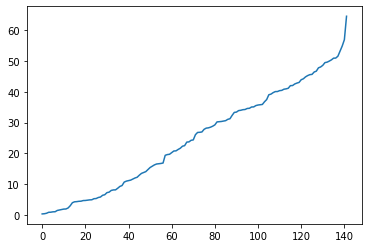

In [138]:
#show error plot
plt.plot(Predicted['Error(%)'])
plt.show()

In [139]:
# Summary

max_error=Predicted['Error(%)'].max()
min_error=Predicted['Error(%)'].min()
mean_error=Predicted['Error(%)'].mean()
#Error = [max_error,min_error,mean_error]
Summary_2=pd.DataFrame([max_error,min_error,mean_error], columns=['New_Matrics'], index=['Max','Min','Mean'])
Summary_2

,New_Matrics
Max,64.562301
Min,0.316416
Mean,24.793156


In [140]:
# recall The Summary matrix from previous analysis
Summary_1

,Store_1,Store_4,Store_19,Store_39,Summary_Matrics
Max,"2,387,950.2","3,676,388.98","2,678,206.42","2,554,482.84","1,383,022.43"
Min,"1,316,899.31","1,762,539.3","1,181,204.53","1,158,698.44","1,228,653.89"
Mean,"1,555,264.4","2,094,712.96","1,444,999.04","1,450,668.13","1,302,962.85"


In [ ]:
Summary_1['New_Matrics'] = Summary_2['New_Matrics']
Summary_1=Summary_1[['Summary_Matrics','New_Matrics','store_1','store_4','store_19','store_39']]

In [142]:
# Summary_Matrics----- matrics obtained when the stores were handled seperatly
#New_Matrics------------matrics obtained when the store with like trends were combined

Summary_1.T

,Max,Min,Mean
Store_1,"2,387,950.2","1,316,899.31","1,555,264.4"
Store_4,"3,676,388.98","1,762,539.3","2,094,712.96"
Store_19,"2,678,206.42","1,181,204.53","1,444,999.04"
Store_39,"2,554,482.84","1,158,698.44","1,450,668.13"
Summary_Matrics,"1,383,022.43","1,228,653.89","1,302,962.85"
New_Matrics,64.562301,0.316416,24.793156


# Conclusion: Forecast with the Stores grouped together is worde than was obtained when each store was handled seperately

Given that none of the above results is satisfactory, The top 10 weekly_sales stores data was detrended and a new forecast with SERIMAX was made

In [145]:
# List of Stores with Stationary TS:
print (f"{len(store_list)} Stores with Stationary TS\n   {store_list}")

45 Stores with Stationary TS
   [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45]


In [146]:
# Remove Trends from The Time Series

dbf =pd.DataFrame(df['Weekly_Sales'])

rolling_means = dbf.rolling(window =7).mean()
rolling_mean_detrended = dbf - rolling_means

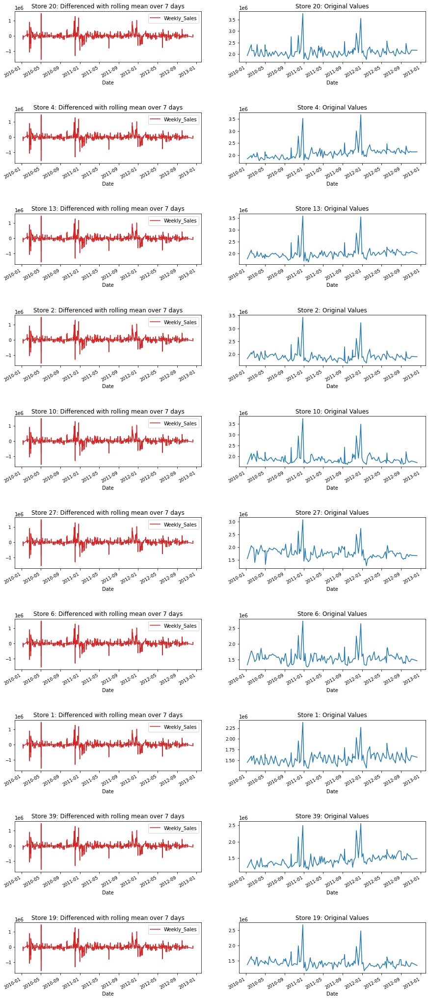

In [147]:
fig, axes =plt.subplots(10,2, figsize=(15,40))
plt.subplots_adjust(hspace = 1.0)

m,n=0,0
for i,j in enumerate(highest_10):
    store_df=get_store_df(df,'Store',j)
    
    m=n+1
    n=m+1
    a1 = plt.subplot(10,2,m)
    a2 = plt.subplot(10,2,n)
    m=i+1
    
    rolling_mean_detrended.plot(color="tab:red",
            title = f"Store {j}: Differenced with rolling mean over 7 days",
                               ax =a1,fontsize =9)
    store_df['Weekly_Sales'].plot(color = "tab:blue",
                    title=f"Store {j}: Original Values", ax =a2,fontsize = 9)

In [148]:
#  Seasonal Decomposition

from statsmodels.tsa.seasonal import seasonal_decompose

In [149]:
rolling_mean_detrended['Store']=df['Store']
rolling_mean_detrended.head()

,Weekly_Sales,Store
Date,,
2010-05-02,NaN,1
2010-12-02,NaN,1
2010-02-19,NaN,1
2010-02-26,NaN,1
2010-05-03,NaN,1


In [150]:
data=rolling_mean_detrended.dropna()
data.head()

,Weekly_Sales,Store
Date,,
2010-03-19,-66656.804286,1
2010-03-26,-100562.534286,1
2010-02-04,96688.562857,1
2010-09-04,56645.904286,1
2010-04-16,-30761.587143,1


<Figure size 432x288 with 0 Axes>

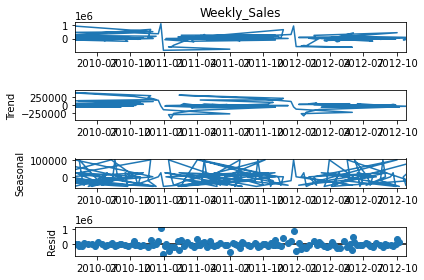

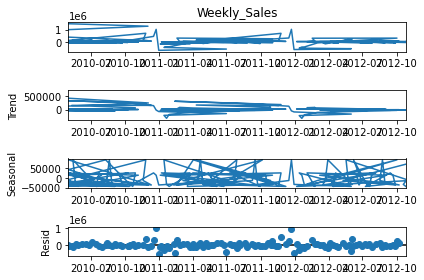

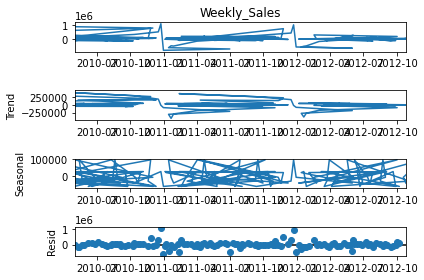

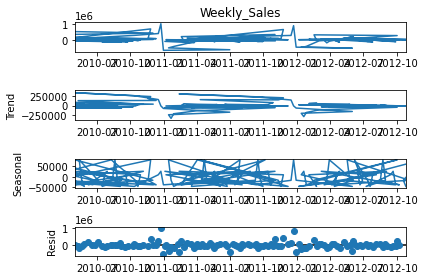

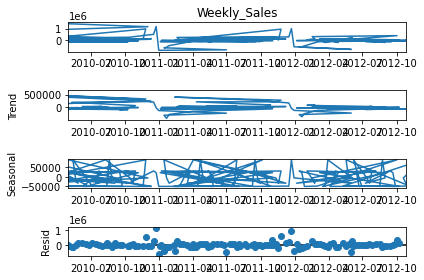

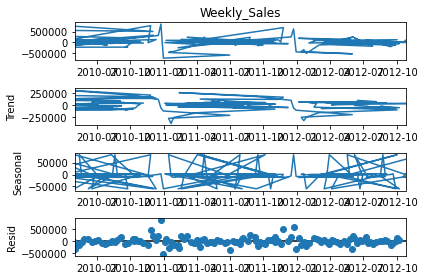

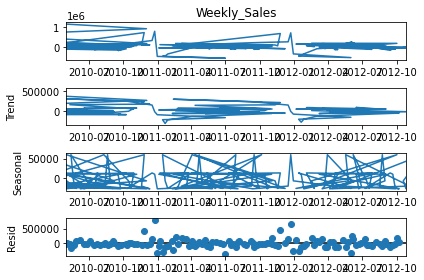

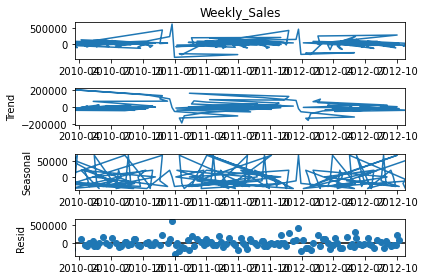

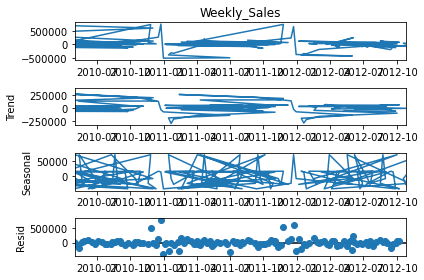

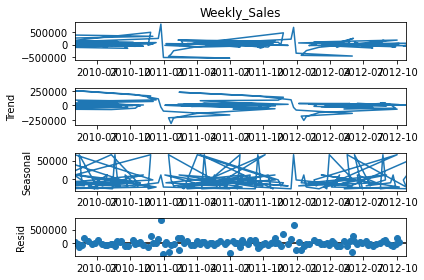

In [151]:
#series, model ='additive', period=1
#fig, axes =plt.subplots(10,2, figsize=(15,40))

plt.subplots_adjust(hspace =1.0)

for i in highest_10:
    store_df=get_store_df(data,'Store',i)
    store_df=pd.DataFrame(store_df)
    d_res = seasonal_decompose(store_df['Weekly_Sales'], period =7)
    
    d_res.plot();

In [152]:
rolling_mean_detrended.shape

(6435, 2)

# Remove Seasonality from the TS

In [153]:
r_m_d =rolling_mean_detrended.copy()
r_m_d_1 =rolling_mean_detrended.copy()

r_m_d =pd.DataFrame(r_m_d)
r_m_d.head()

,Weekly_Sales,Store
Date,,
2010-05-02,NaN,1
2010-12-02,NaN,1
2010-02-19,NaN,1
2010-02-26,NaN,1
2010-05-03,NaN,1


In [154]:
r_m_d =r_m_d.dropna()
print(r_m_d.head())
print(f"\nShape: {r_m_d.shape}")

             Weekly_Sales  Store
Date                            
2010-03-19  -66656.804286      1
2010-03-26 -100562.534286      1
2010-02-04   96688.562857      1
2010-09-04   56645.904286      1
2010-04-16  -30761.587143      1

Shape: (6429, 2)


In [155]:
from pandas.core.window import rolling
#remove Seasonality

#shift() - it just shift index by desired number of periods with an optimal time frequency

r_m_d_1=pd.DataFrame((r_m_d['Weekly_Sales']-r_m_d['Weekly_Sales'].shift()))
r_m_d_1.head()

,Weekly_Sales
Date,
2010-03-19,NaN
2010-03-26,-33905.730000
2010-02-04,197251.097143
2010-09-04,-40042.658571
2010-04-16,-87407.491429


In [156]:
r_m_d_1['Store']=r_m_d['Store']
r_m_d_1.head()

,Weekly_Sales,Store
Date,,
2010-03-19,NaN,1
2010-03-26,-33905.730000,1
2010-02-04,197251.097143,1
2010-09-04,-40042.658571,1
2010-04-16,-87407.491429,1


In [157]:
r_m_d_1=r_m_d_1.dropna()
r_m_d_1.shape

(6428, 2)

In [158]:
highest_5

[20, 4, 13, 2, 10]

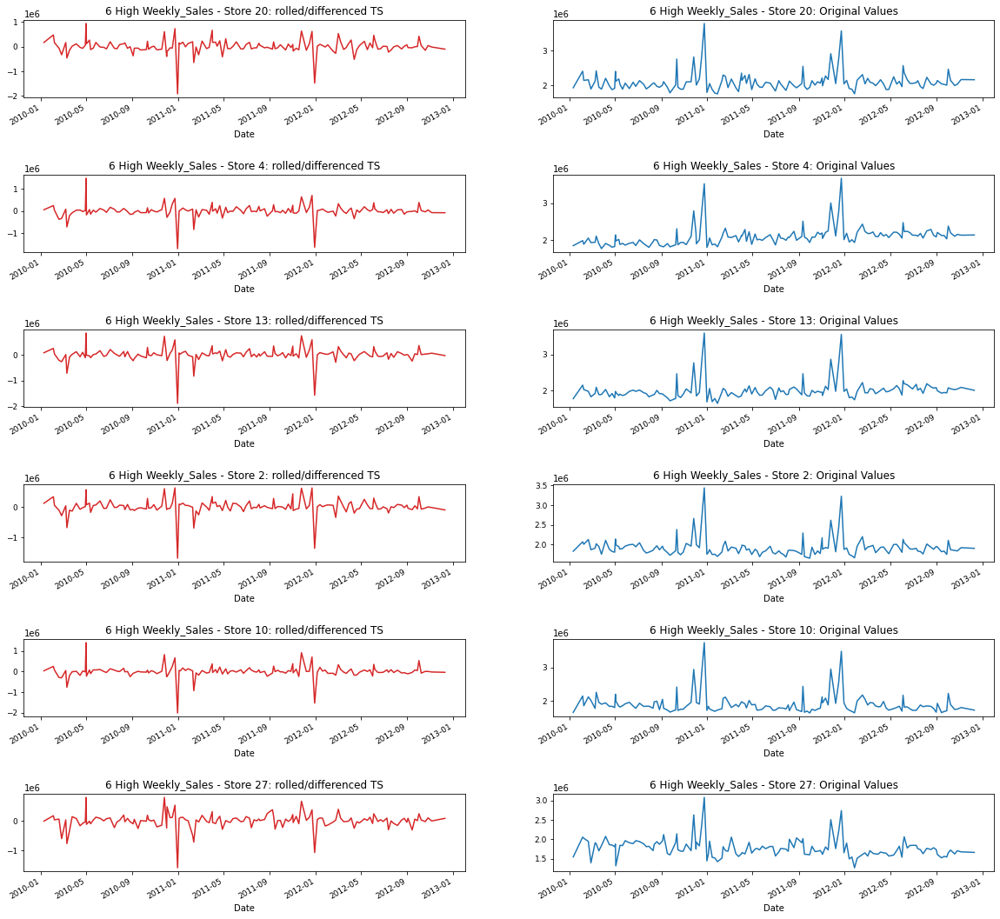

In [159]:
#plot the new TS after detrending and removing Seasonality

fig, axes = plt.subplots(6,2, figsize=(20,20))
plt.subplots_adjust(hspace=1.)

m,n=0,0
for i,j in enumerate(highest_6):
    store_r_m_d=get_store_df(r_m_d_1,'Store',j)      #detrended TS
    store_df =get_store_df(df,'Store',j)             # original TS
    
    m=n+1
    n=m+1
    a1 = plt.subplot(6,2,m)
    a2 = plt.subplot(6,2,n)
    m=i+1
    
    store_r_m_d['Weekly_Sales'].plot(color="tab:red", title = 
        f"{len(highest_6)} High Weekly_Sales - Store {j}: rolled/differenced TS",
                                ax =a1, fontsize =9)
    store_df['Weekly_Sales'].plot(color = "tab:blue",
                    title=f"{len(highest_6)} High Weekly_Sales - Store {j}: Original Values",
                            ax =a2, fontsize =9)
                                 

In [160]:
highest_10

[20, 4, 13, 2, 10, 27, 6, 1, 39, 19]

In [161]:
# Find Best ARIMA for the Rolled & Differenced TS

for i in highest_10:
    print(f"Highest Weekly_Sales: Best order for ARIMA model for Store #{i}")
    store_df=get_store_df(r_m_d_1,'Store',i)
    multiplemodels = auto_arima(store_df['Weekly_Sales'], trace =True)
    print("\n_______________________________________________________________")

Highest Weekly_Sales: Best order for ARIMA model for Store #20
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3976.481, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=4019.190, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=4005.459, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3994.115, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4017.190, Time=0.00 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3978.810, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3985.794, Time=0.07 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=3974.057, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=3986.029, Time=0.13 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=3980.361, Time=0.17 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=3971.353, Time=0.20 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=3970.355, Time=0.13 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=3971.269, Time=0.07 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   

# Forecast with detrended TS

In [162]:
from statsmodels.tsa.statespace.sarimax import SARIMAX, SARIMAXResults

In [167]:
#Forecast with the Rolled & Differenced TS
# SERIMA forecast
#fig, axes =plt.subplots(5,1, figsize=(16,16))
#plt.subplots_adjust(hspace = 0.9)
# j=1
predicted_list =list()
Forecast=pd.DataFrame()     #dataframe of stores forecast
S_ARIMA_order =[[2,0,3],[1,0,3],[5,0,1],[1,0,4],[5,0,2],[0,0,5]]
S_season_order =[[2,0,3,7],[1,0,3,7],[5,0,1,7],[1,0,4,7],[5,0,2,7],[0,0,5,7]]
forecast_list, train_list =[],[]
Forecast_df=list()

for i in highest_10:
    store_df =get_store_df(r_m_d_1,'Store',i)
    store_index=store_df.index
    store_df=pd.DataFrame(store_df['Weekly_Sales'],
                         columns=['Weekly_Sales'], index=store_index)
    
    store_df = remove_outliers(store_df)
    size=int(store_df.shape[0]*0.75)   #size for train,test split the data @75:25
    train, test = store_df.iloc[:size,:], store_df.iloc[size:,:]
    
    start_1 = train.shape[0]
    end_1 =(train.shape[0] + test.shape[0])-1
    
    train_index=train.index
    test_index=test.index
    
    if i==10 or i==13 or i==20 or i==27:
        arima_order = S_ARIMA_order[0]
        Season_order= S_season_order[0]
        
    elif i==4 or i==6:
        arima_order = S_ARIMA_order[1]
        Season_order= S_season_order[1]
        
    elif i==39:
        arima_order = S_ARIMA_order[2]
        Season_order= S_season_order[2]
        
    elif i==2:
        arima_order = S_ARIMA_order[3]
        Season_order= S_season_order[3]
        
    elif i==1:
        arima_order = S_ARIMA_order[4]
        Season_order= S_season_order[4]
        
    elif i==19:
        arima_order = S_ARIMA_order[5]
        Season_order= S_season_order[5]
    
    #Forecast with SARIMAX
    model = SARIMAX(train, order=arima_order, seasonal_order=Season_order,
                   initialization='approximate_diffuse')
    #model fit
    model = model.fit()
    
    forecast = model.forecast(steps = No_of_wks).tolist()  #5-year forecast 
    #Forecasts
    forecast_df = pd.DataFrame(forecast, columns=['Weelky_Sales'], index=Index)
    Forecast_df.append(forecast_df)
    forecast_list.append(forecast)
    train_list.append(train)
    
    
    #predictions
    predicted_ = model.predict(start=start_1, end=end_1, dynamic =True)
    predicted_list.append(predicted_)
    
    
    print(f'Weekly Sales Predictions for Store {i}')
    predictions.append(get_predictions(test.values.flatten(),predicted_)) #store the predictions in a list


Weekly Sales Predictions for Store 20

=========================Predicted Results==============================
          Actual      Predicted     Error(%)
0    -823.115714  -51802.822939 -6193.504308
1   -9944.387143   91356.666349 -1018.675681
2  -12839.328571  -51941.717895  -304.551668
3 -139801.787143  223040.133499  -259.540259
4  -42399.572857 -148717.027086  -250.751239 
________________________________________________________
Median error: -21.36%
Mean   error: -49.16%
______________________________________________________

Weekly Sales Predictions for Store 4

=========================Predicted Results==============================
         Actual      Predicted    Error(%)
0 -35369.860000 -377972.432845 -968.628581
1  -7924.502857  -44453.546376 -460.963220
2 -17141.684286   56510.390354 -429.666498
3 -36938.611429  114218.470444 -409.211597
4 -60501.922857  140952.932927 -332.972650 
________________________________________________________
Median error: -46.9%
Mean   error

In [168]:
test.shape

(35, 1)

In [169]:
train.head()

,Weekly_Sales
Date,
2010-05-02,301955.052857
2010-12-02,-51824.834286
2010-02-19,-93876.684286
2010-02-26,-182858.231429
2010-05-03,62322.285714


In [170]:
# show the new forecast results

Forecast =pd.DataFrame(index=Index)
for i in range(len(highest_10)):
    Forecast['store_'+str(highest_10[i])] =forecast_list[i]
Forecast

,store_20,store_4,store_13,store_2,store_10,store_27,store_6,store_1,store_39,store_19
2012-12-02,-121212.697243,-91562.982624,-56970.678644,190992.496038,161852.298781,-37724.048645,78087.586444,-92651.656740,150409.168612,61768.912808
2012-12-09,-56769.432089,31753.533366,-188112.787695,-165176.086739,567.487763,-10534.103841,-2280.245998,-178039.268995,-30635.862739,-86692.343988
2012-12-16,-148717.027086,5614.188200,-49546.070443,-106801.235030,-155763.744238,-45739.307148,-195904.348432,-28636.585394,13197.974776,-5028.324643
2012-12-23,73223.897396,51395.442264,115380.449003,-46611.612133,61381.645678,-31733.603928,40717.023674,87600.874854,14576.909767,32823.900654
2012-12-30,10375.913156,315300.761093,60451.872659,-169806.960132,-57478.180918,-21015.283752,-17023.460571,-242208.252170,-37090.517588,48906.131298
2013-01-06,-194145.452722,-221295.682235,-34523.871276,-21405.048592,111730.556056,-222285.650089,-31400.656251,-15300.606865,89423.833640,61730.635775
2013-01-13,90023.472530,163892.039098,-168724.802935,130209.214271,-146972.549101,-30246.466803,-16605.794442,11743.460556,5360.335725,-47190.046876
2013-01-20,-154724.206705,140952.932927,-4912.726465,-207208.003580,-62883.330611,-29747.022161,-2318.297555,38045.089488,30648.705262,-2675.648458
2013-01-27,84569.420465,120815.464870,119309.103920,-51274.446351,78441.826652,-23692.731944,15517.387788,89506.229600,-43296.495183,14997.721872
2013-02-03,-11546.664316,-20401.620769,40943.170890,-9766.948056,-40053.972151,10059.539968,151712.946772,4693.983983,121262.209473,3359.006660


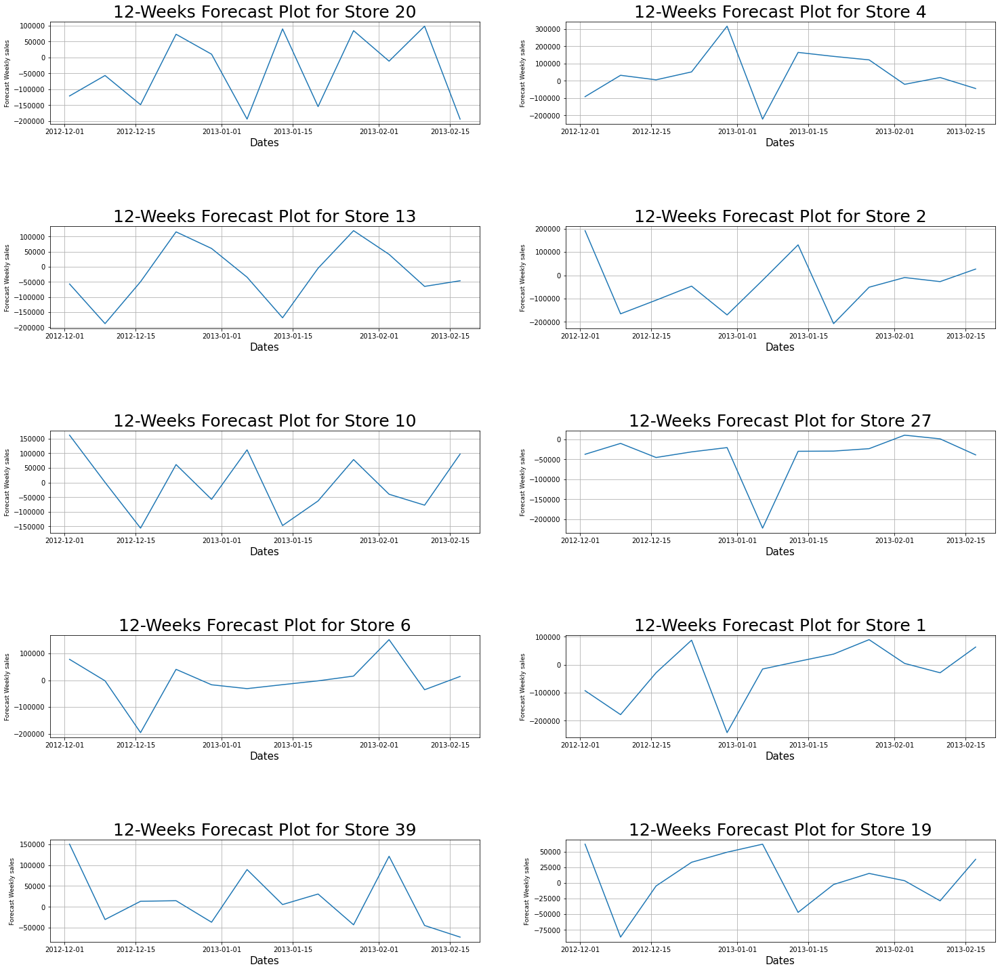

In [171]:
plot_ts_forecast(forecast_list,Index,train_list, 5,2,wl=25,ww=25,hs=1.)

In [172]:
train_list[0].head(12)

,Weekly_Sales
Date,
2010-12-02,-402364.085714
2010-02-19,-65165.388571
2010-02-26,-333381.217143
2010-05-03,111533.452857
2010-12-03,-206792.092857
2010-03-19,-149087.905714
2010-03-26,15273.451429
2010-09-04,-375634.174286
2010-04-16,-34524.618571


In [173]:
pd.DataFrame(forecast_list[0]).mean()

0   -43708.068972
dtype: float64

In [174]:
# show Weekly_sales forecast summary for the selected stores
Summary_detrend=pd.DataFrame()

for i,store_no in enumerate(highest_10):
    Max=pd.DataFrame(forecast_list[i]).max()
    Min=pd.DataFrame(forecast_list[i]).min()
    Mean=pd.DataFrame(forecast_list[i]).mean()    
    
    Summary_detrend['store_'+str(store_no)]=pd.DataFrame([Max,Min,Mean],
                                index=['Max_Forecast','Min_Forecast','Mean_Forecast'])
Summary_detrend.T

,Max_Forecast,Min_Forecast,Mean_Forecast
store_20,98685.814538,-194259.865590,-43708.068972
store_4,315300.761093,-221295.682235,39244.415939
store_13,119309.103920,-188112.787695,-23168.947803
store_2,190992.496038,-207208.003580,-38131.695755
store_10,161852.298781,-155763.744238,-2442.612396
store_27,10059.539968,-222285.650089,-40083.090726
store_6,151712.946772,-195904.348432,-85.548993
store_1,89506.229600,-242208.252170,-24243.181442
store_39,150409.168612,-72814.119657,16342.061149
store_19,61768.912808,-86692.343988,7562.331371


In [ ]:
Much better Forecast